In [1]:
from typing import Tuple
import cv2  # To process images
import numpy as np  # To calculate matrix operations
from os import listdir  # To find images in a file
from os.path import isfile, join  # To find images in a file
import matplotlib.pyplot as plt
SHOW_IMAGES = True # Should only be True when debugging! - ag

In [2]:
# Classifiers to find face and eyes in an image:
face_casc = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
eye_casc  = cv2.CascadeClassifier("haarcascade_eye.xml")

In [3]:
# Color ranges for BGR color space.
bgr_colors = {
    "Light Blue": {
        "thresh" : [ 50,  60,  60],
        "bgr"    : [210, 120, 100]
    },
    "Dark Blue": {
        "thresh" : [ 70, 70, 30],
        "bgr"    : [140, 60, 30]
    },
    "Light Green": {
        "thresh" : [ 70,  50, 60],
        "bgr"    : [160, 210, 100]
    },
    "Dark Green": {
        "thresh" : [ 50,  40, 50],
        "bgr"    : [ 80, 140, 50]
    },
    "Dark Brown": {
        "thresh" : [15, 15, 20], #[27, 26, 37],
        "bgr"    : [43, 52, 100]            
    },
    "Light Brown": {
        "thresh" : [40, 45, 30], #[27, 26, 37],
        "bgr"    : [50, 40, 150]            
    }
}

# Color ranges for HSV  color space.
hsv_colors = {
    "Dark Blue": {
        "hsv"    : [120, 175, 165],
        "thresh" : [ 10,  100,  90]
    },
    "Light Blue": {
       "hsv"    : [105, 165, 165],
       "thresh" : [ 15,  100,  100]
    },
    "Dark Green": {
        "hsv"    : [ 60, 165, 165],
        "thresh" : [ 20,  120,  90]
    },
    "Light Green": {
        "hsv"    : [ 60, 165, 165],
        "thresh" : [ 20,  120,  90]
    },
    "Dark Brown": {
        "hsv"    : [ 15, 185, 90],
        "thresh" : [ 10, 50, 55]
    },
    "Light Brown": {
        "hsv"    : [ 30, 185, 150],
        "thresh" : [ 10, 50, 95]
    }
}

In [4]:
def find_images_in_folder(path: str) -> list:
    file_list = []
    for filename in listdir(path):
        fullpath = join(path, filename)
        if filename.endswith(".jpg") or filename.endswith(".png"):
            file_list.append(fullpath)

    assert len(file_list) > 0, "No images found in given path!"
    return file_list


def show_image(title: str, image, show_anyway=False):
    if not show_anyway and not SHOW_IMAGES:
        return
    print("Displaying:", title)
    #cv2.imshow(title, image)
    plt.title(title)
    #plt.imshow(image, cmap = "RGB")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()
    # OpenCV does not show images if we don't call waitKey()
    #cv2.waitKey()


def resize_image(img, width, height):
    resized = cv2.resize(img, (width, height), interpolation = cv2.INTER_AREA)
    return resized.copy()

In [5]:
# You'd need to feed face pics to the program and call this function. It works. - Abdulkerim
def get_faces(img) -> list:
    faces = []

    scaling_multiplier = 0.5
    height = int(img.shape[0] * scaling_multiplier)
    width = int(img.shape[1] * scaling_multiplier)

    img = resize_image(img, width, height)

    # Convert image to grayscale
    grayscaled = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    show_image("Grayscaled Image", grayscaled)

    # Detect faces
    face_coords = face_casc.detectMultiScale(grayscaled, 1.1, 4)

    for (x, y, w, h) in face_coords:
        # Draw a rectange around the face: (255, 0, 0) is in BGR format and 2 is the thickness.
        # cv2.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), 2)
        faceRegion = img[y : (y + h), x : (x + w)]
        faces.append(faceRegion.copy())

    return faces

def get_eyes_from_face(face) -> list:
    eyes = []
    greyFaceRegion = cv2.cvtColor(face, cv2.COLOR_BGR2GRAY)
    eye_coords = eye_casc.detectMultiScale(greyFaceRegion, 1.1, 4)
    for (x, y, w, h) in eye_coords:
        # Draw a rectange around the eyes
        # cv2.rectangle(face, (x, y), (x + w, y + h), (255, 0, 0), 2)
        eye_region = face[y : (y + h), x : (x + w)]
        show_image("Eyes", eye_region)
        eyes.append(eye_region.copy())

    return eyes

In [6]:
# This paper explains a method for skin masking
# https://www.sciencedirect.com/science/article/abs/pii/S0262885620300573
def skin_extraction(img):
    img_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    skin_mask_in_hsv = cv2.inRange(img_HSV,(0, 15, 0),(17,170,255))
    skin_mask_in_hsv = cv2.morphologyEx(skin_mask_in_hsv, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))
    
    img_YCrCb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

    skin_mask_in_ycrcb = cv2.inRange(img_YCrCb,(0, 135, 85),(255,180,135)) 
    skin_mask_in_ycrcb = cv2.morphologyEx(skin_mask_in_ycrcb, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))
    
    global_mask = cv2.bitwise_and(skin_mask_in_ycrcb, skin_mask_in_hsv)
    global_mask = cv2.medianBlur(global_mask,3)
    global_mask = cv2.morphologyEx(global_mask, cv2.MORPH_OPEN, np.ones((4,4), np.uint8))
    global_result = cv2.bitwise_not(global_mask)

    return global_result.copy()

In [7]:
# Adjusting contrast for beter masking.
def add_contrast(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    
    l, a, b = cv2.split(lab) # Extract different channels

    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    cl = clahe.apply(l)

    limg = cv2.merge((cl,a,b)) # Merge the new l channel with old channels 
    final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return final.copy()

# Applies all available masks to extract only iris from an image.
def apply_all_masks(eye):
    contrasted = add_contrast(eye)
    show_image("cont", contrasted)
    
    skin_mask = skin_extraction(contrasted)
    show_image("skin_mask:", skin_mask)

    skin_masked = cv2.bitwise_and(eye, eye, mask = skin_mask)
    show_image("res", skin_masked)

    grayscaled = cv2.cvtColor(eye, cv2.COLOR_BGR2GRAY)
    ret, black_mask = cv2.threshold(grayscaled, 20, 255,cv2.THRESH_BINARY)
    show_image("Black mask", black_mask)

    black_masked = cv2.bitwise_and(skin_masked,skin_masked,mask=black_mask)
    show_image("Black Masked: ", black_masked)

    ret, white_mask = cv2.threshold(grayscaled, 110, 255, cv2.THRESH_BINARY_INV)
    show_image("White Mask: ", white_mask)
    
    white_masked = cv2.bitwise_and(black_masked, black_masked, mask=white_mask)
    show_image("white_masked ", white_masked)

    return white_masked

# Finds number of pixels a mask thinks are the expected color
def black_and_white_count(mask):
    flattened = mask.flatten()
    unique, counts = np.unique(flattened, return_counts=True)
    count = dict(zip(unique, counts))
    
    if 255 not in count.keys():
        count[255] = 0

    return (count[0], count[255])

In [8]:
# Detect color in BGR color space
def detect_color_bgr(eye, color):
    assert color in bgr_colors, "color parameter is not supported!" 
    bgr    = bgr_colors[color]["bgr"]
    thresh = bgr_colors[color]["thresh"]

    minBGR = np.array([bgr[0] - thresh[0], bgr[1] - thresh[1], bgr[2] - thresh[2]])
    maxBGR = np.array([bgr[0] + thresh[0], bgr[1] + thresh[1], bgr[2] + thresh[2]])

    maskBGR = cv2.inRange(eye, minBGR, maxBGR)
    show_image(color + " mask", maskBGR, True)
    plt.imshow(maskBGR)
    resultBGR = cv2.bitwise_and(eye, eye, mask = maskBGR)

    show_image(color + " result", resultBGR, True)

    return (black_and_white_count(maskBGR))

# Detect color in HSV color space
def detect_color_hsv(eye, color):
    assert color in hsv_colors, "color parameter is not supported!" 
    eyeHSV = cv2.cvtColor(eye, cv2.COLOR_BGR2HSV)
    show_image("eyeHSV", eyeHSV, True)
    plt.imshow(eyeHSV)
    hsv    = hsv_colors[color]["hsv"]
    thresh = hsv_colors[color]["thresh"]
    
    minHSV = np.array([hsv[0] - thresh[0], hsv[1] - thresh[1], hsv[2] - thresh[2]])
    maxHSV = np.array([hsv[0] + thresh[0], hsv[1] + thresh[1], hsv[2] + thresh[2]])
    
    maskHSV = cv2.inRange(eyeHSV, minHSV, maxHSV) 
    show_image(color + " maskHSV", maskHSV, True)

    resultHSV = cv2.bitwise_and(eyeHSV, eyeHSV, mask = maskHSV)
    show_image(color + " resultHSV", resultHSV, True)

    return (black_and_white_count(maskHSV))

[(0, 'aa/images/green (1).jpg'), (1, 'aa/images/green (3).jpg'), (2, 'aa/images/blue (4).jpg'), (3, 'aa/images/brown (3).jpg'), (4, 'aa/images/green (2).jpg'), (5, 'aa/images/blue (3).jpg'), (6, 'aa/images/brown (1).jpg'), (7, 'aa/images/brown (4).jpg'), (8, 'aa/images/brown (2).jpg'), (9, 'aa/images/blue (1).jpg'), (10, 'aa/images/blue (6).jpg'), (11, 'aa/images/blue (5).jpg'), (12, 'aa/images/blue (2).jpg')]
aa/images/green (1).jpg
Displaying: Original 


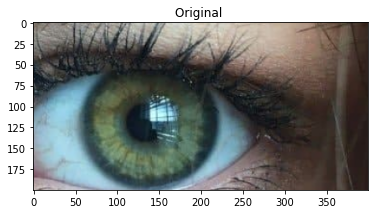

Displaying: cont


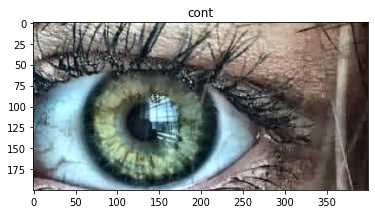

Displaying: skin_mask:


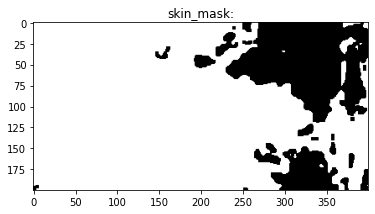

Displaying: res


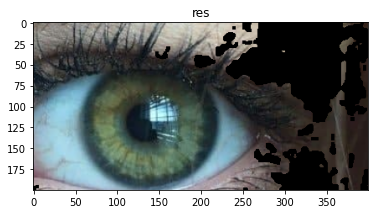

Displaying: Black mask


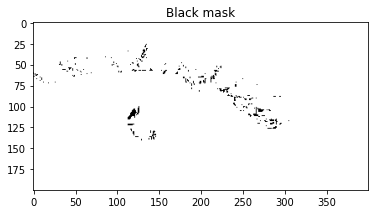

Displaying: Black Masked: 


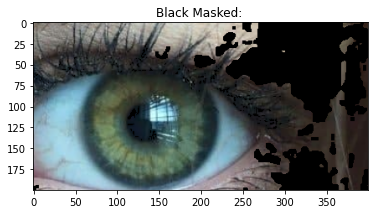

Displaying: White Mask: 


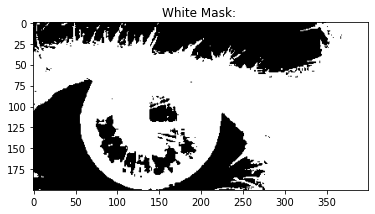

Displaying: white_masked 


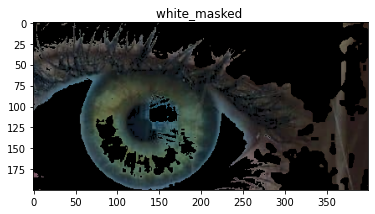

Displaying: Light Blue mask


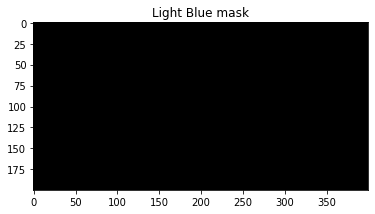

Displaying: Light Blue result


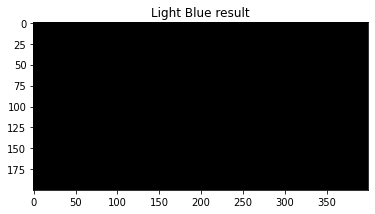

Displaying: Dark Blue mask


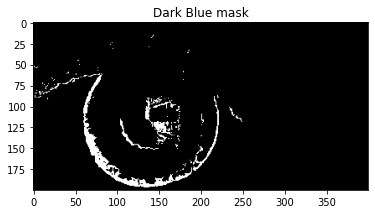

Displaying: Dark Blue result


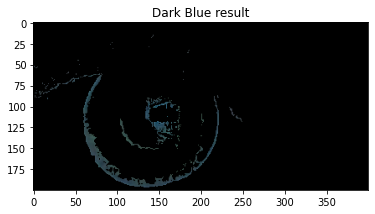

Displaying: Light Green mask


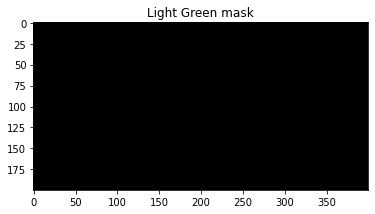

Displaying: Light Green result


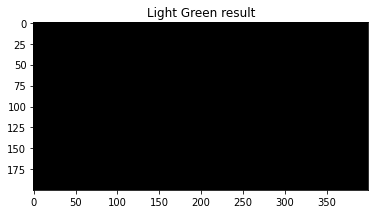

Displaying: Dark Green mask


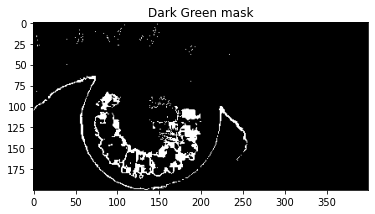

Displaying: Dark Green result


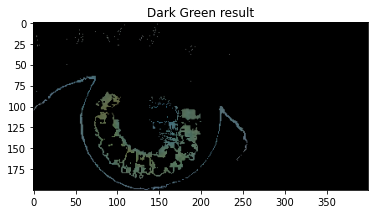

Displaying: Dark Brown mask


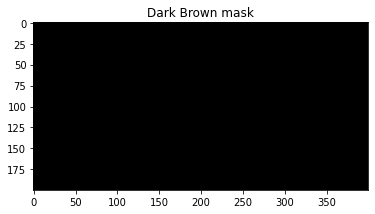

Displaying: Dark Brown result


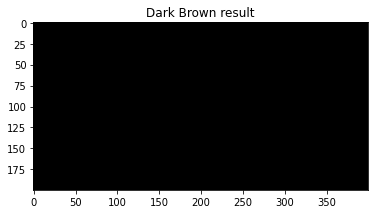

Displaying: Light Brown mask


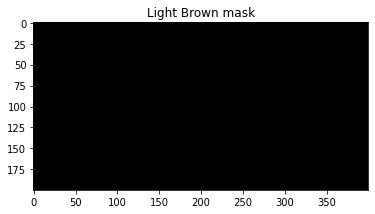

Displaying: Light Brown result


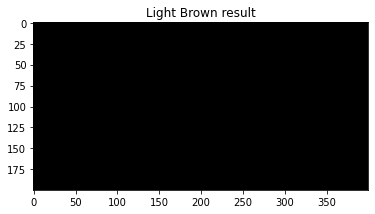

Displaying: eyeHSV


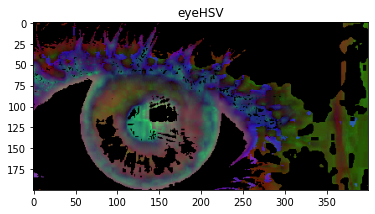

Displaying: Dark Blue maskHSV


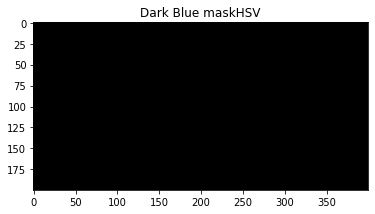

Displaying: Dark Blue resultHSV


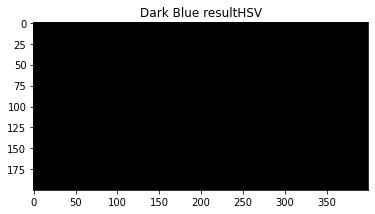

Displaying: eyeHSV


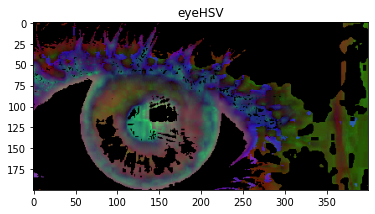

Displaying: Light Blue maskHSV


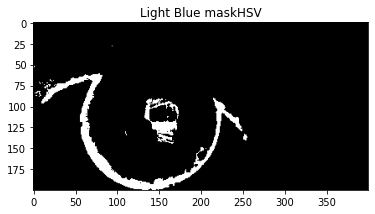

Displaying: Light Blue resultHSV


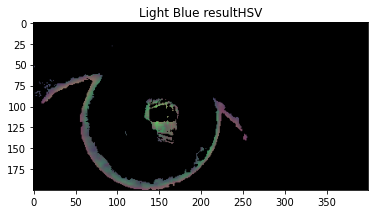

Displaying: eyeHSV


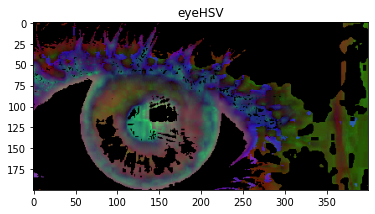

Displaying: Dark Green maskHSV


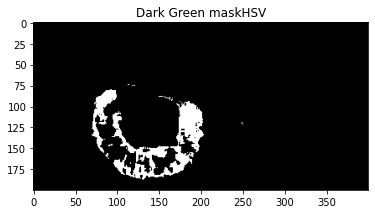

Displaying: Dark Green resultHSV


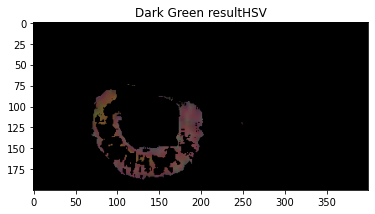

Displaying: eyeHSV


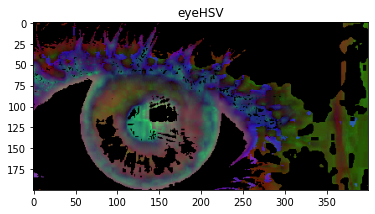

Displaying: Light Green maskHSV


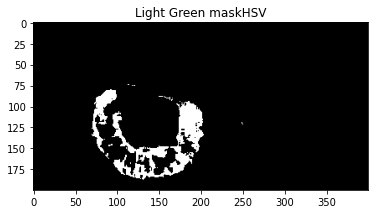

Displaying: Light Green resultHSV


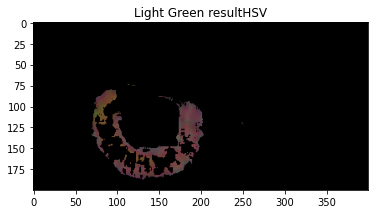

Displaying: eyeHSV


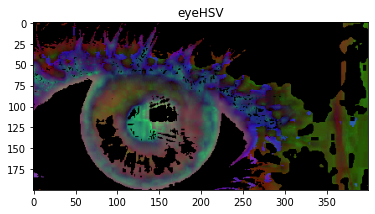

Displaying: Dark Brown maskHSV


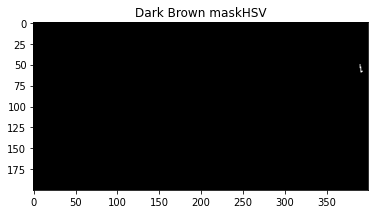

Displaying: Dark Brown resultHSV


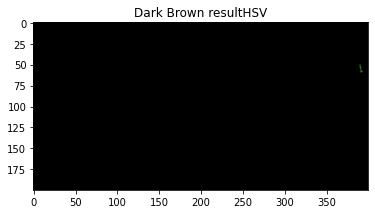

Displaying: eyeHSV


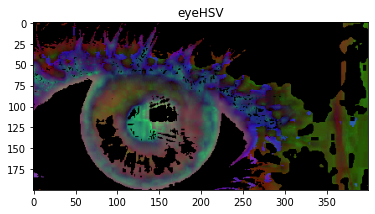

Displaying: Light Brown maskHSV


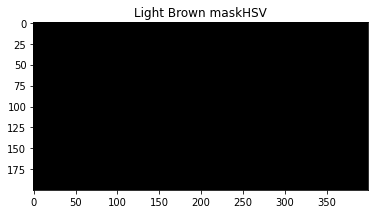

Displaying: Light Brown resultHSV


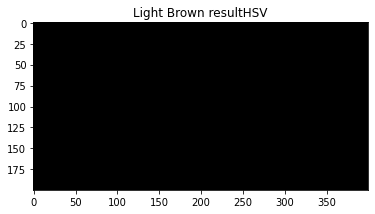

BGR Results {'Light Blue': 0.0, 'Dark Blue': 0.0326375, 'Light Green': 0.0, 'Dark Green': 0.046175, 'Dark Brown': 0.0, 'Light Brown': 0.0}
HSV Results {'Dark Blue': 0.0, 'Light Blue': 0.0535375, 'Dark Green': 0.048525, 'Light Green': 0.048525, 'Dark Brown': 0.0001875, 'Light Brown': 0.0}
BGR found Dark Green 4.6175 %
HSV found Light Blue 5.35375 %
------------------------------
aa/images/green (3).jpg
Displaying: Original 


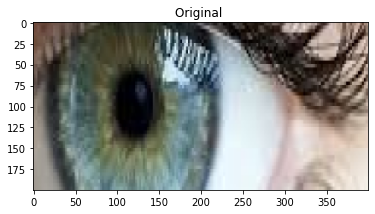

Displaying: cont


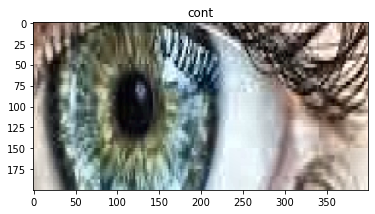

Displaying: skin_mask:


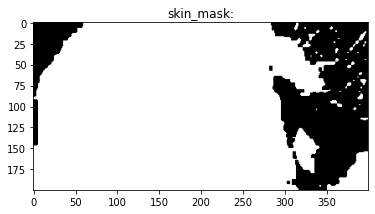

Displaying: res


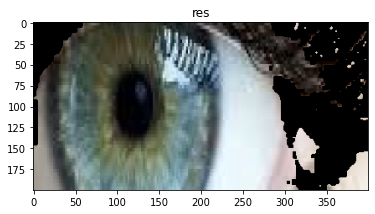

Displaying: Black mask


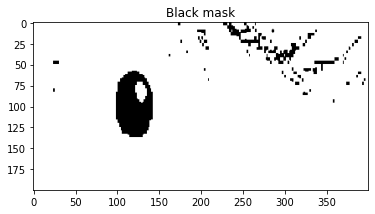

Displaying: Black Masked: 


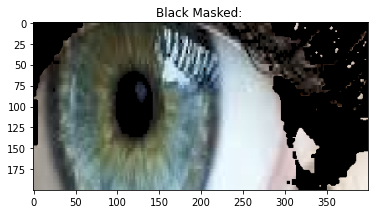

Displaying: White Mask: 


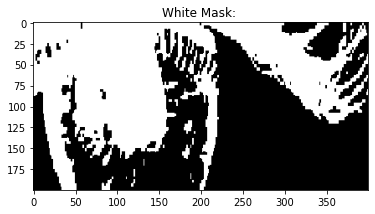

Displaying: white_masked 


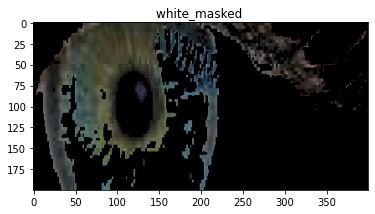

Displaying: Light Blue mask


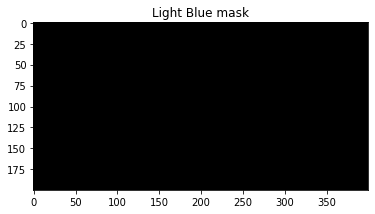

Displaying: Light Blue result


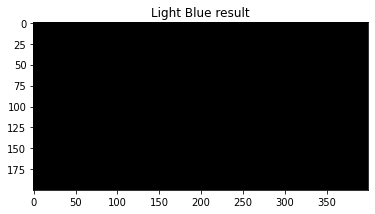

Displaying: Dark Blue mask


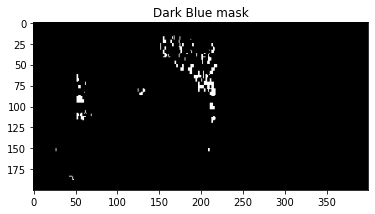

Displaying: Dark Blue result


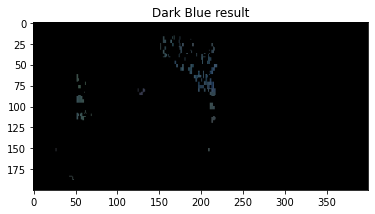

Displaying: Light Green mask


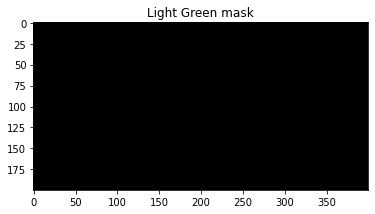

Displaying: Light Green result


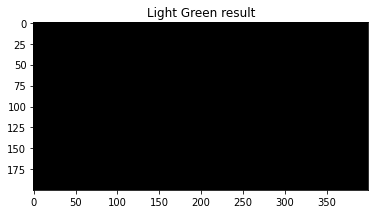

Displaying: Dark Green mask


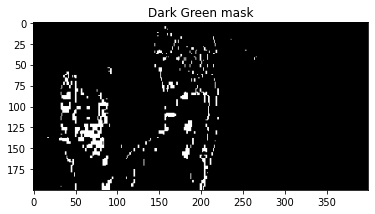

Displaying: Dark Green result


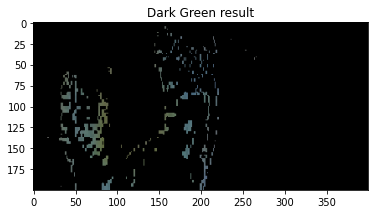

Displaying: Dark Brown mask


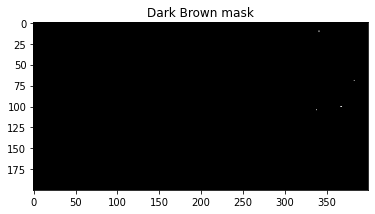

Displaying: Dark Brown result


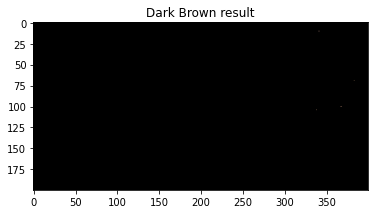

Displaying: Light Brown mask


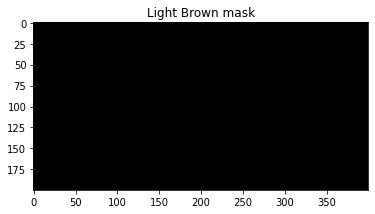

Displaying: Light Brown result


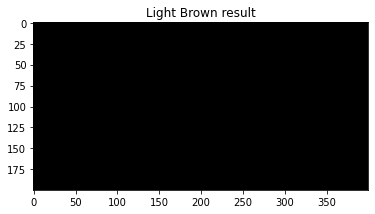

Displaying: eyeHSV


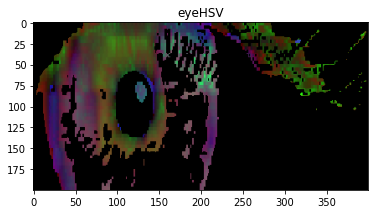

Displaying: Dark Blue maskHSV


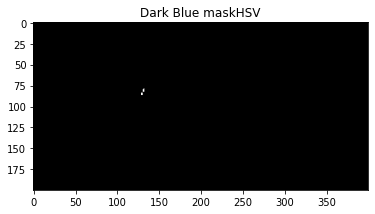

Displaying: Dark Blue resultHSV


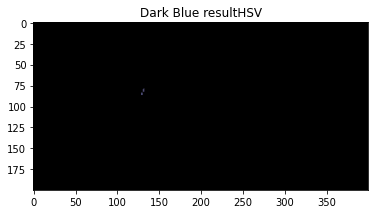

Displaying: eyeHSV


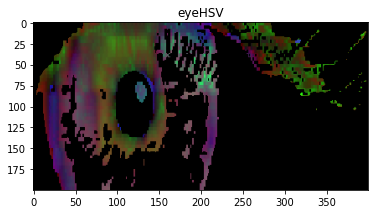

Displaying: Light Blue maskHSV


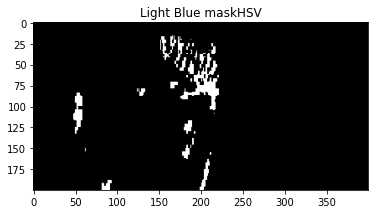

Displaying: Light Blue resultHSV


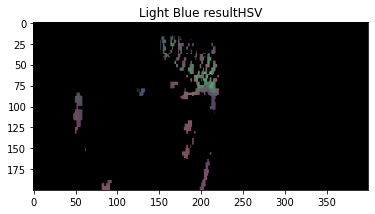

Displaying: eyeHSV


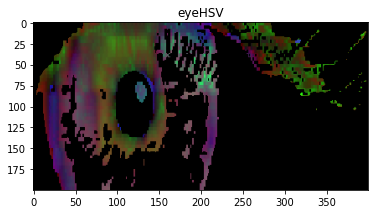

Displaying: Dark Green maskHSV


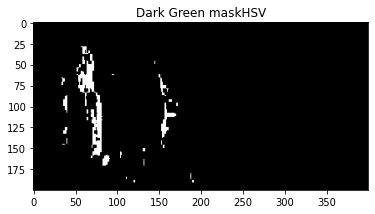

Displaying: Dark Green resultHSV


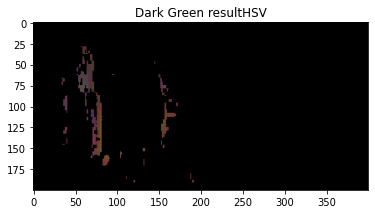

Displaying: eyeHSV


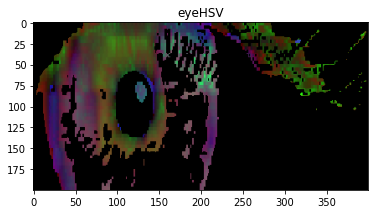

Displaying: Light Green maskHSV


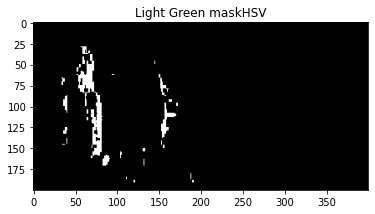

Displaying: Light Green resultHSV


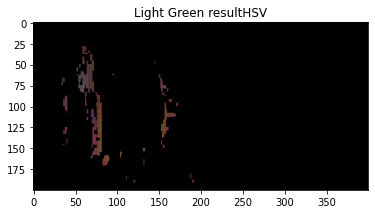

Displaying: eyeHSV


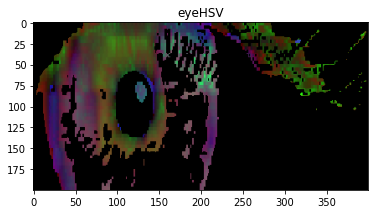

Displaying: Dark Brown maskHSV


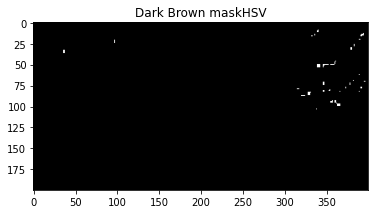

Displaying: Dark Brown resultHSV


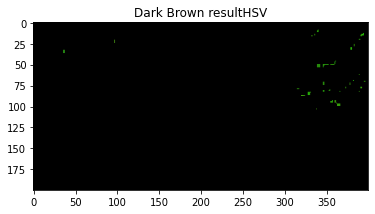

Displaying: eyeHSV


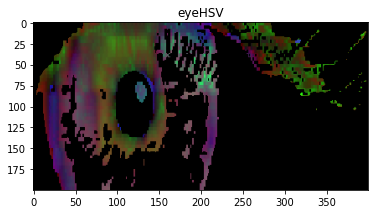

Displaying: Light Brown maskHSV


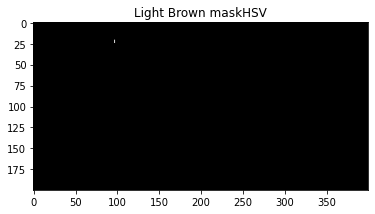

Displaying: Light Brown resultHSV


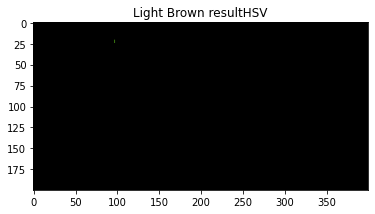

BGR Results {'Light Blue': 0.0, 'Dark Blue': 0.011825, 'Light Green': 0.0, 'Dark Green': 0.0401625, 'Dark Brown': 7.5e-05, 'Light Brown': 0.0}
HSV Results {'Dark Blue': 0.0001625, 'Light Blue': 0.03045, 'Dark Green': 0.022975, 'Light Green': 0.022975, 'Dark Brown': 0.00195, 'Light Brown': 5e-05}
BGR found Dark Green 4.016249999999999 %
HSV found Light Blue 3.045 %
------------------------------
aa/images/blue (4).jpg
Displaying: Original 


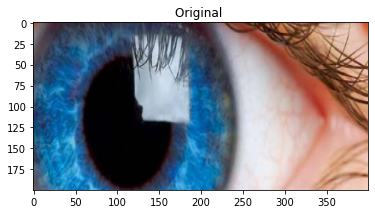

Displaying: cont


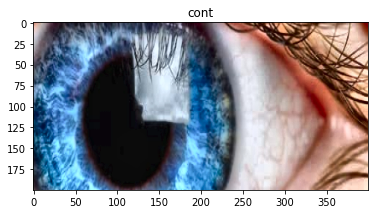

Displaying: skin_mask:


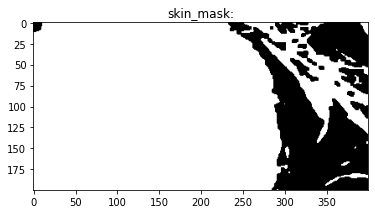

Displaying: res


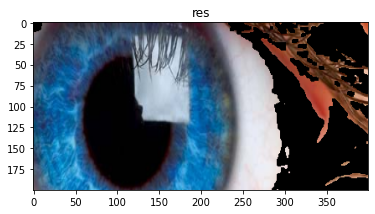

Displaying: Black mask


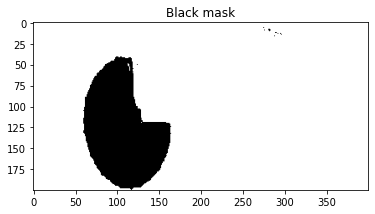

Displaying: Black Masked: 


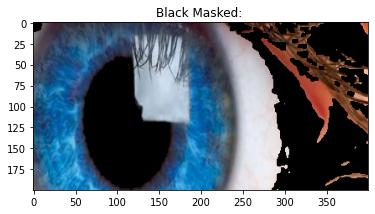

Displaying: White Mask: 


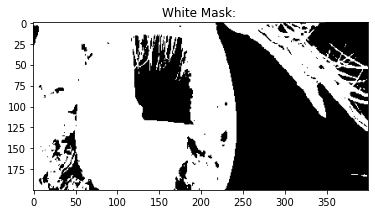

Displaying: white_masked 


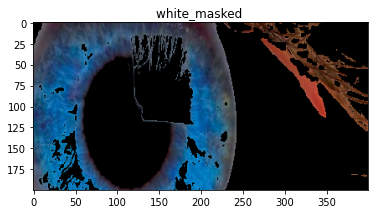

Displaying: Light Blue mask


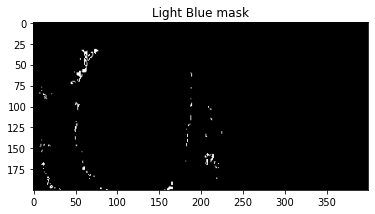

Displaying: Light Blue result


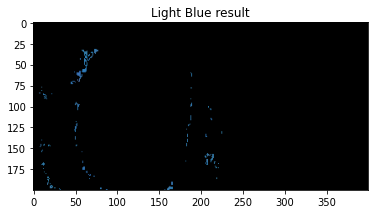

Displaying: Dark Blue mask


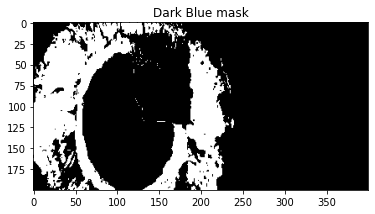

Displaying: Dark Blue result


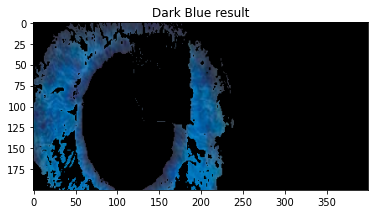

Displaying: Light Green mask


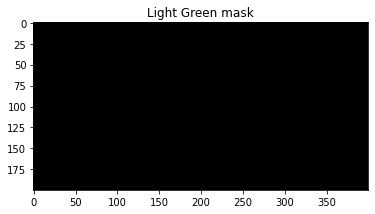

Displaying: Light Green result


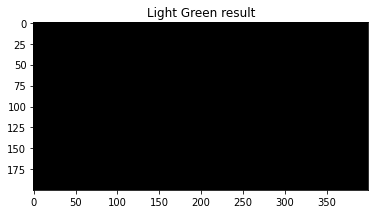

Displaying: Dark Green mask


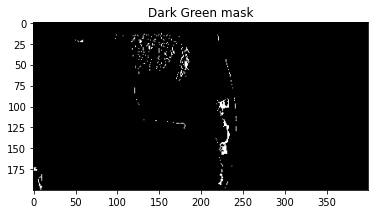

Displaying: Dark Green result


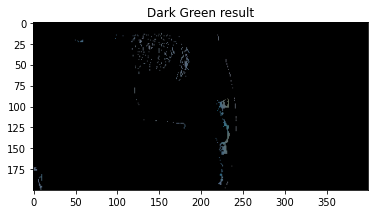

Displaying: Dark Brown mask


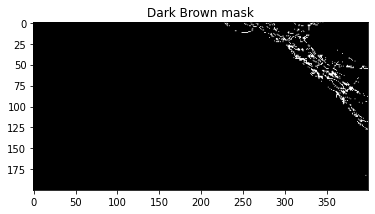

Displaying: Dark Brown result


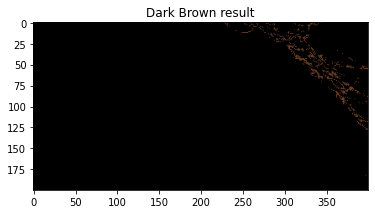

Displaying: Light Brown mask


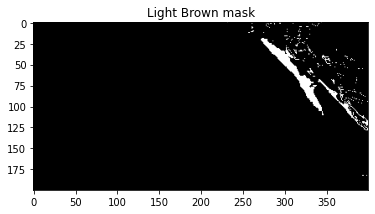

Displaying: Light Brown result


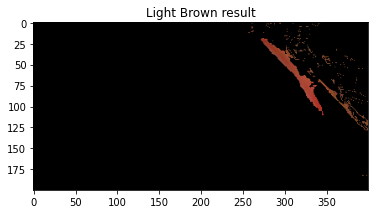

Displaying: eyeHSV


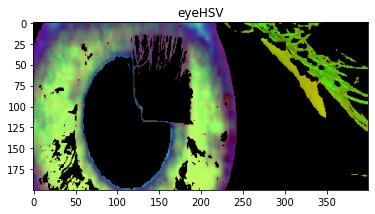

Displaying: Dark Blue maskHSV


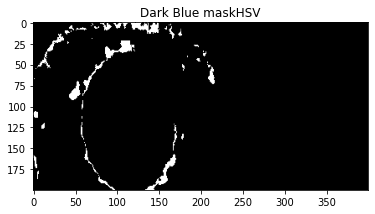

Displaying: Dark Blue resultHSV


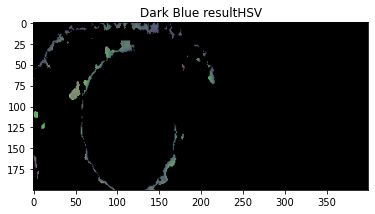

Displaying: eyeHSV


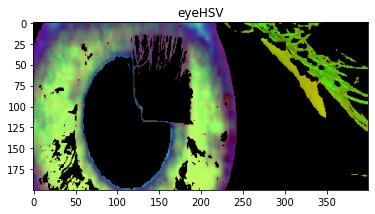

Displaying: Light Blue maskHSV


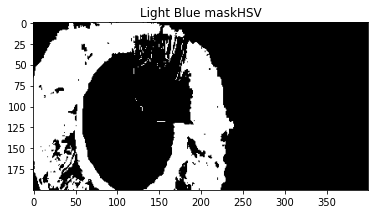

Displaying: Light Blue resultHSV


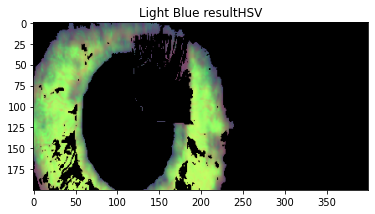

Displaying: eyeHSV


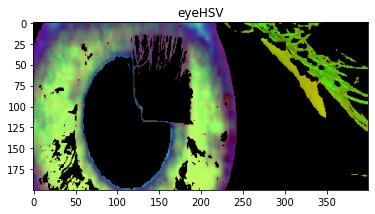

Displaying: Dark Green maskHSV


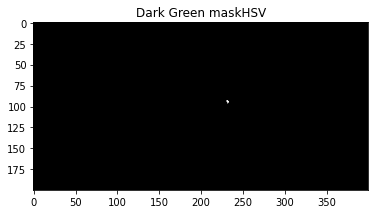

Displaying: Dark Green resultHSV


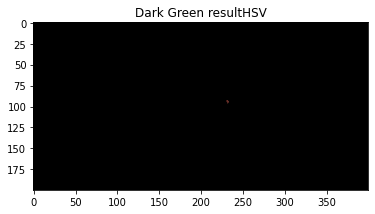

Displaying: eyeHSV


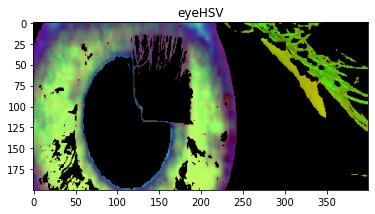

Displaying: Light Green maskHSV


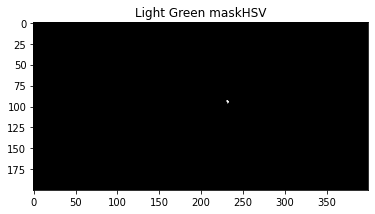

Displaying: Light Green resultHSV


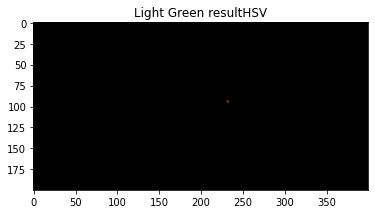

Displaying: eyeHSV


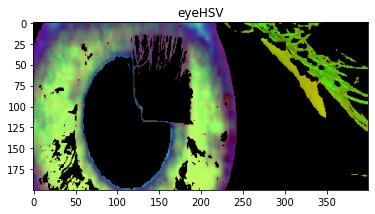

Displaying: Dark Brown maskHSV


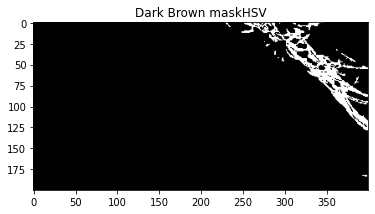

Displaying: Dark Brown resultHSV


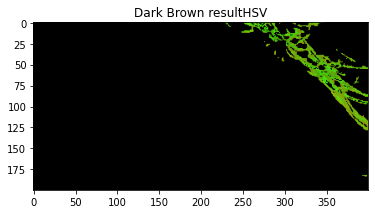

Displaying: eyeHSV


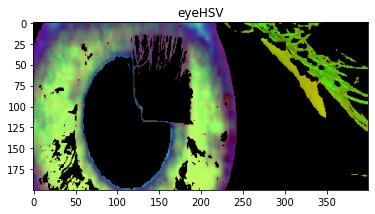

Displaying: Light Brown maskHSV


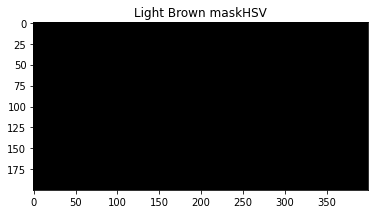

Displaying: Light Brown resultHSV


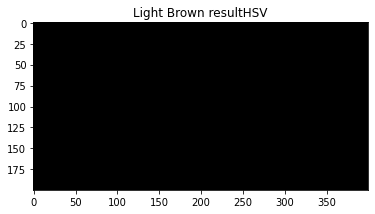

BGR Results {'Light Blue': 0.0058625, 'Dark Blue': 0.2356375, 'Light Green': 0.0, 'Dark Green': 0.0095375, 'Dark Brown': 0.012075, 'Light Brown': 0.0208}
HSV Results {'Dark Blue': 0.0271, 'Light Blue': 0.2745375, 'Dark Green': 0.0001, 'Light Green': 0.0001, 'Dark Brown': 0.0385125, 'Light Brown': 0.0}
BGR found Dark Blue 23.56375 %
HSV found Light Blue 27.45375 %
------------------------------
aa/images/brown (3).jpg
Displaying: Original 


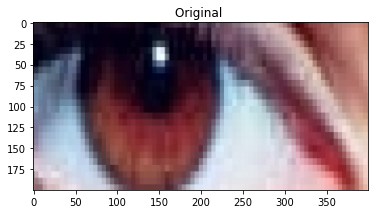

Displaying: cont


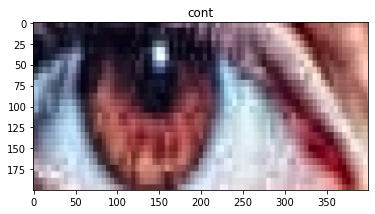

Displaying: skin_mask:


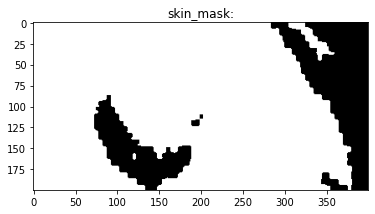

Displaying: res


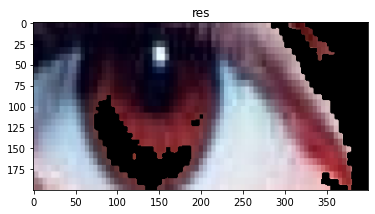

Displaying: Black mask


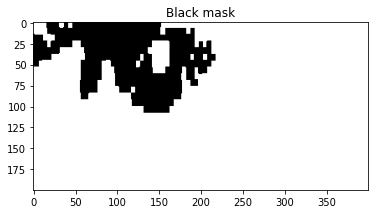

Displaying: Black Masked: 


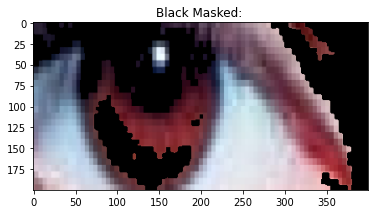

Displaying: White Mask: 


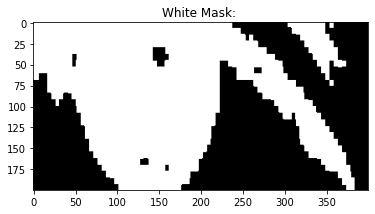

Displaying: white_masked 


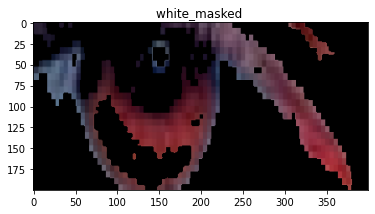

Displaying: Light Blue mask


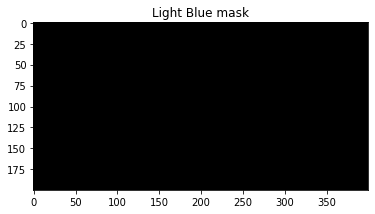

Displaying: Light Blue result


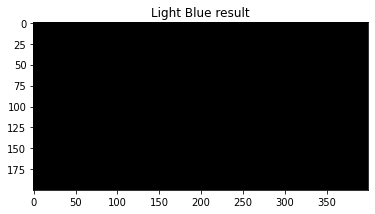

Displaying: Dark Blue mask


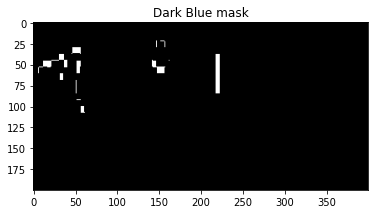

Displaying: Dark Blue result


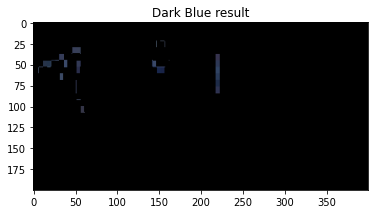

Displaying: Light Green mask


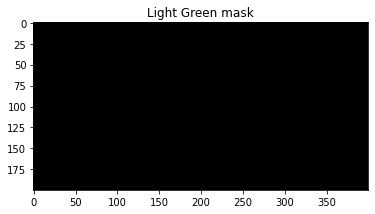

Displaying: Light Green result


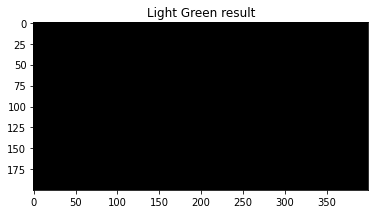

Displaying: Dark Green mask


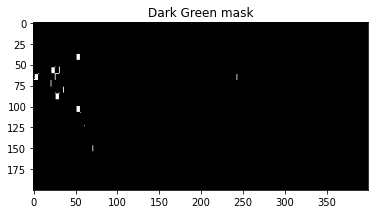

Displaying: Dark Green result


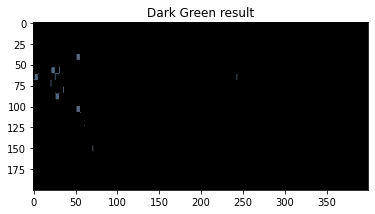

Displaying: Dark Brown mask


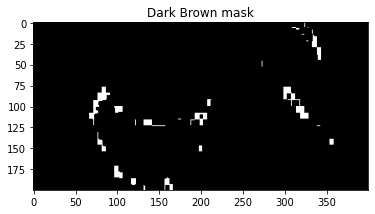

Displaying: Dark Brown result


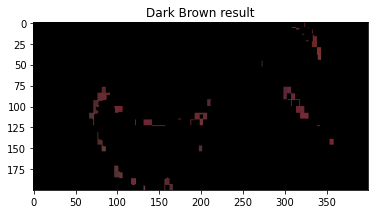

Displaying: Light Brown mask


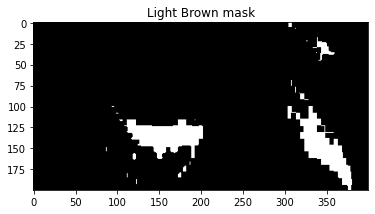

Displaying: Light Brown result


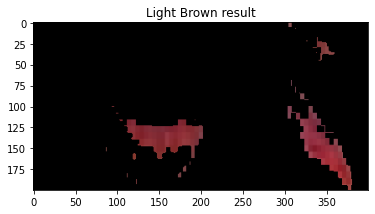

Displaying: eyeHSV


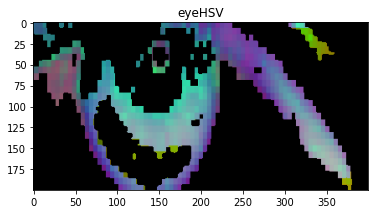

Displaying: Dark Blue maskHSV


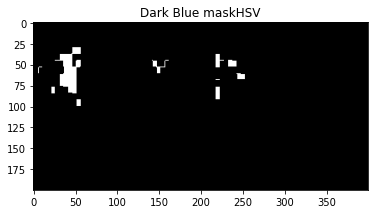

Displaying: Dark Blue resultHSV


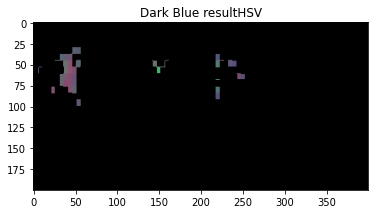

Displaying: eyeHSV


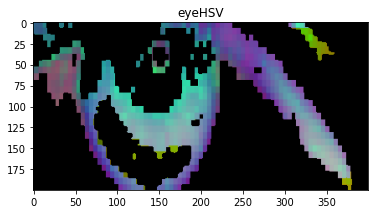

Displaying: Light Blue maskHSV


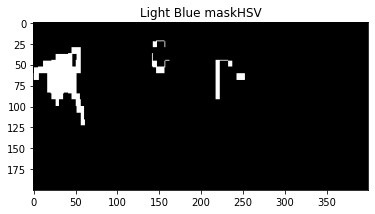

Displaying: Light Blue resultHSV


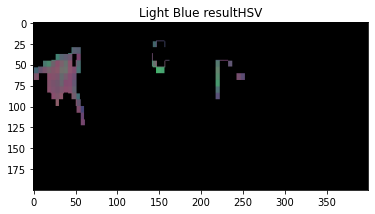

Displaying: eyeHSV


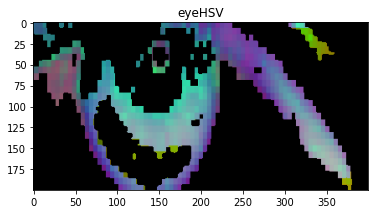

Displaying: Dark Green maskHSV


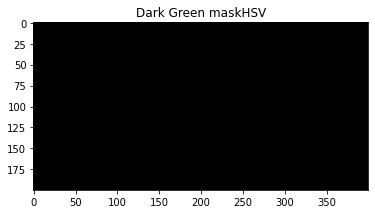

Displaying: Dark Green resultHSV


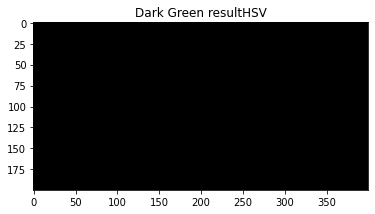

Displaying: eyeHSV


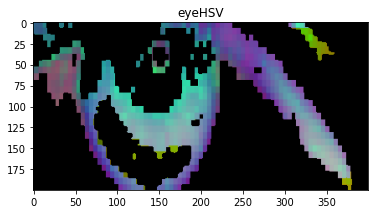

Displaying: Light Green maskHSV


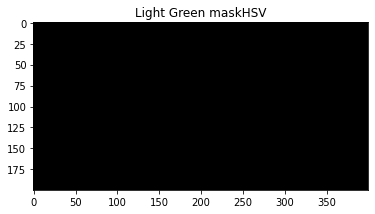

Displaying: Light Green resultHSV


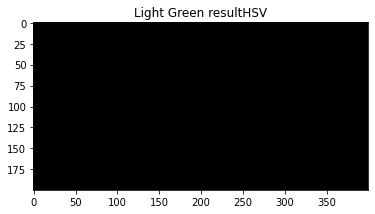

Displaying: eyeHSV


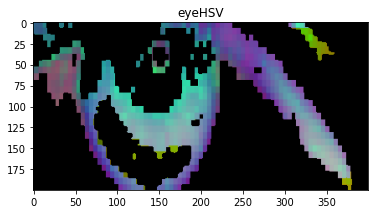

Displaying: Dark Brown maskHSV


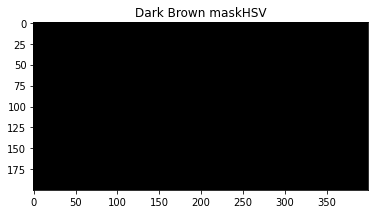

Displaying: Dark Brown resultHSV


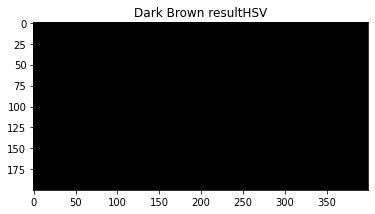

Displaying: eyeHSV


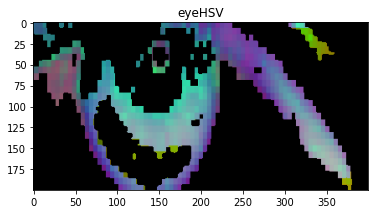

Displaying: Light Brown maskHSV


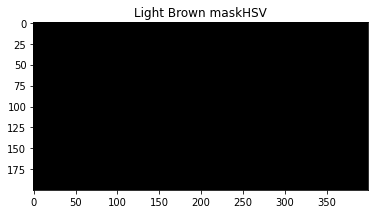

Displaying: Light Brown resultHSV


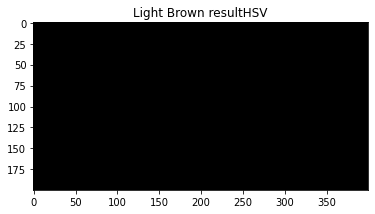

BGR Results {'Light Blue': 0.0, 'Dark Blue': 0.0096, 'Light Green': 0.0, 'Dark Green': 0.0024625, 'Dark Brown': 0.0188875, 'Light Brown': 0.0658375}
HSV Results {'Dark Blue': 0.016375, 'Light Blue': 0.035775, 'Dark Green': 0.0, 'Light Green': 0.0, 'Dark Brown': 0.0, 'Light Brown': 0.0}
BGR found Light Brown 6.583749999999999 %
HSV found Light Blue 3.5775 %
------------------------------
aa/images/green (2).jpg
Displaying: Original 


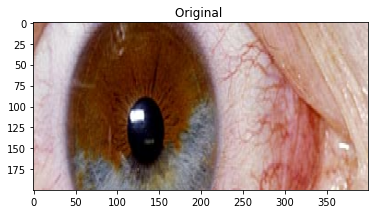

Displaying: cont


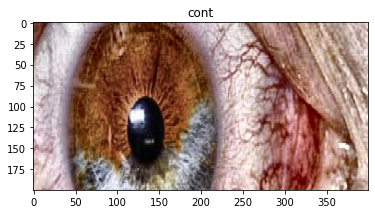

Displaying: skin_mask:


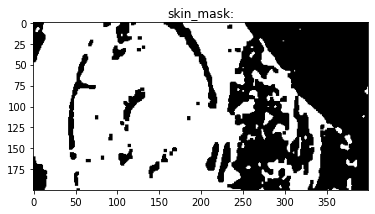

Displaying: res


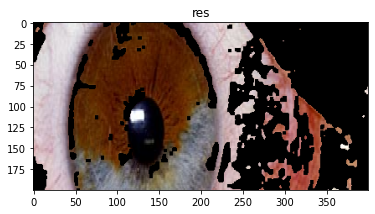

Displaying: Black mask


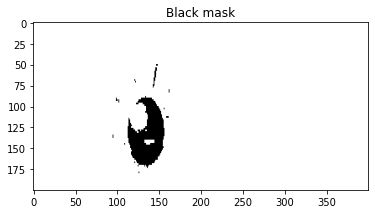

Displaying: Black Masked: 


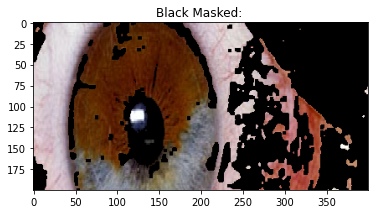

Displaying: White Mask: 


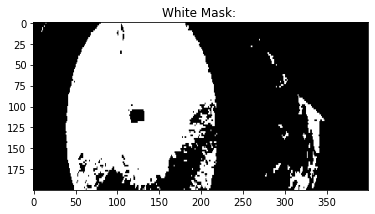

Displaying: white_masked 


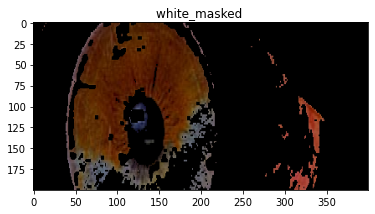

Displaying: Light Blue mask


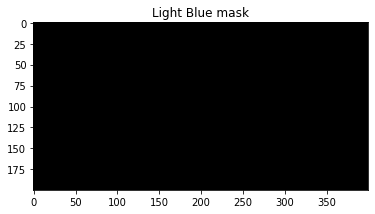

Displaying: Light Blue result


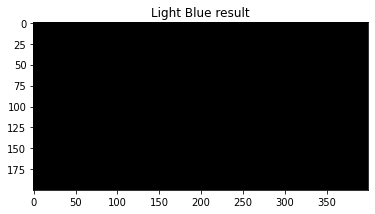

Displaying: Dark Blue mask


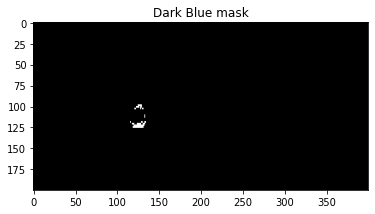

Displaying: Dark Blue result


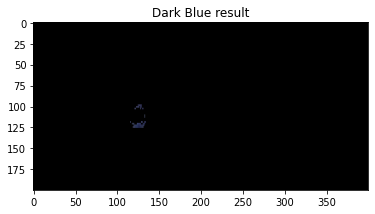

Displaying: Light Green mask


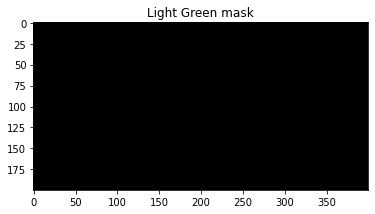

Displaying: Light Green result


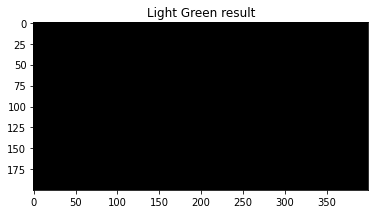

Displaying: Dark Green mask


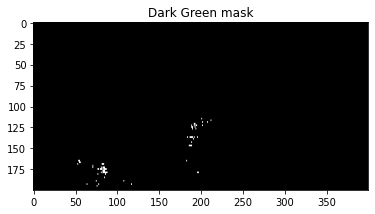

Displaying: Dark Green result


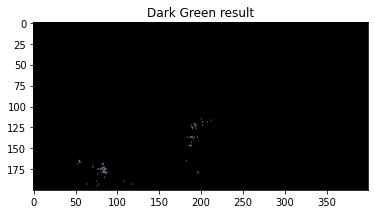

Displaying: Dark Brown mask


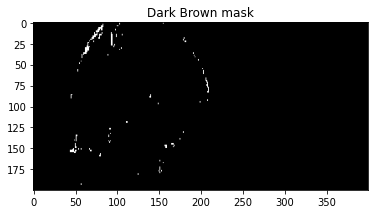

Displaying: Dark Brown result


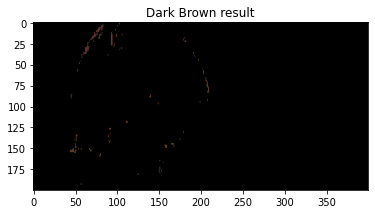

Displaying: Light Brown mask


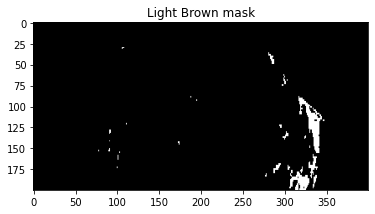

Displaying: Light Brown result


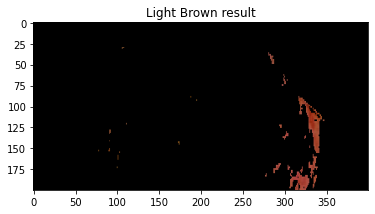

Displaying: eyeHSV


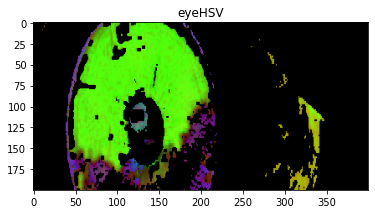

Displaying: Dark Blue maskHSV


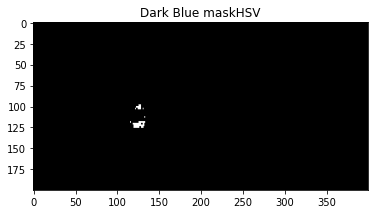

Displaying: Dark Blue resultHSV


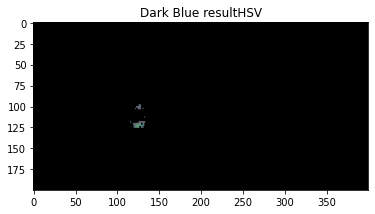

Displaying: eyeHSV


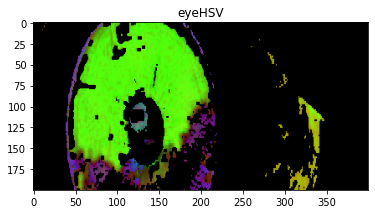

Displaying: Light Blue maskHSV


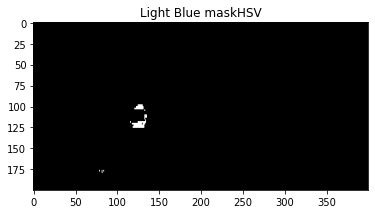

Displaying: Light Blue resultHSV


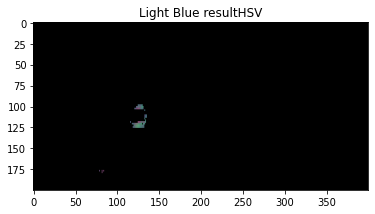

Displaying: eyeHSV


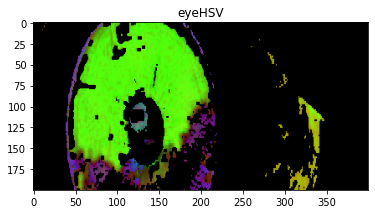

Displaying: Dark Green maskHSV


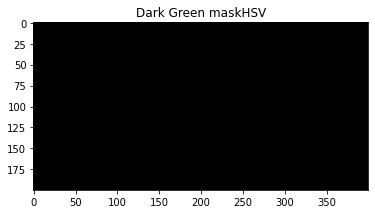

Displaying: Dark Green resultHSV


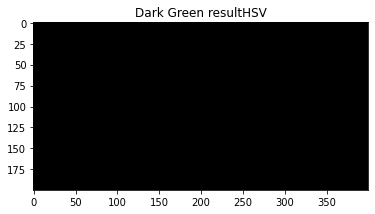

Displaying: eyeHSV


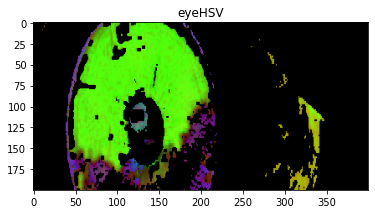

Displaying: Light Green maskHSV


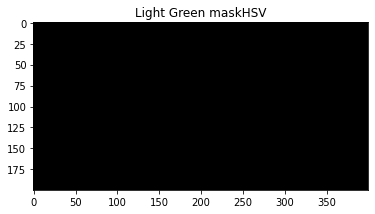

Displaying: Light Green resultHSV


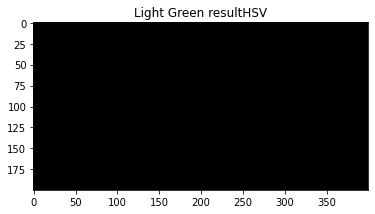

Displaying: eyeHSV


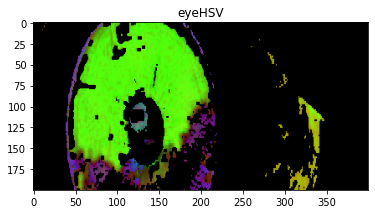

Displaying: Dark Brown maskHSV


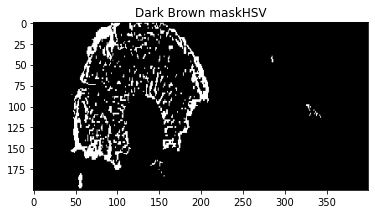

Displaying: Dark Brown resultHSV


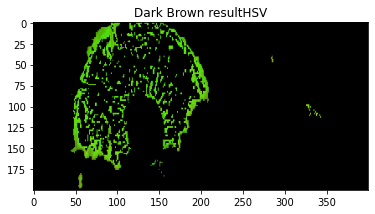

Displaying: eyeHSV


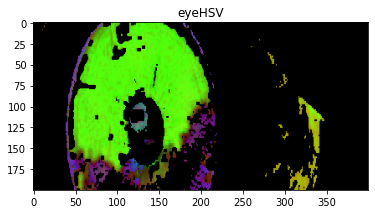

Displaying: Light Brown maskHSV


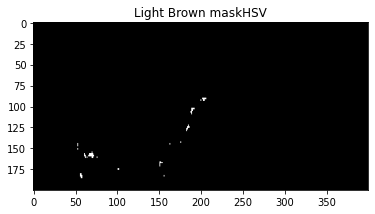

Displaying: Light Brown resultHSV


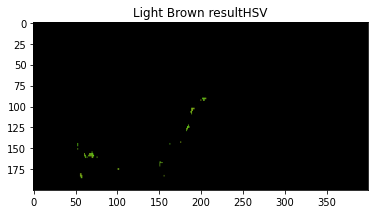

BGR Results {'Light Blue': 0.0, 'Dark Blue': 0.0015, 'Light Green': 0.0, 'Dark Green': 0.00185, 'Dark Brown': 0.0046625, 'Light Brown': 0.016375}
HSV Results {'Dark Blue': 0.0015, 'Light Blue': 0.0023, 'Dark Green': 0.0, 'Light Green': 0.0, 'Dark Brown': 0.0649625, 'Light Brown': 0.001625}
BGR found Light Brown 1.6375000000000002 %
HSV found Dark Brown 6.496250000000001 %
------------------------------
aa/images/blue (3).jpg
Displaying: Original 


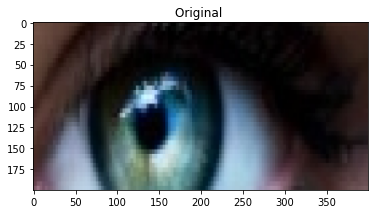

Displaying: cont


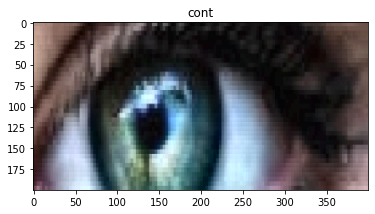

Displaying: skin_mask:


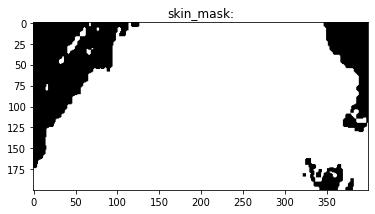

Displaying: res


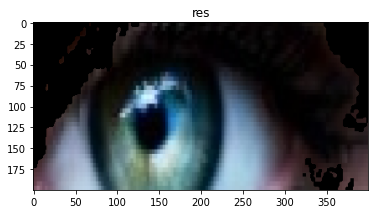

Displaying: Black mask


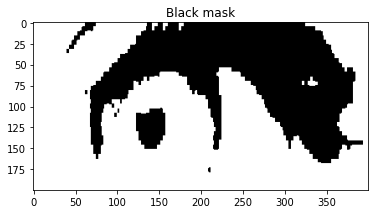

Displaying: Black Masked: 


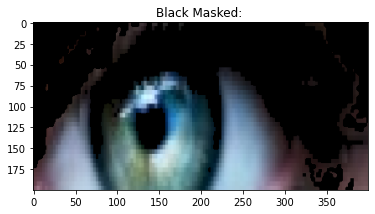

Displaying: White Mask: 


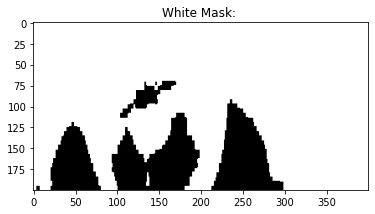

Displaying: white_masked 


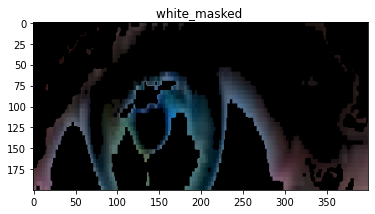

Displaying: Light Blue mask


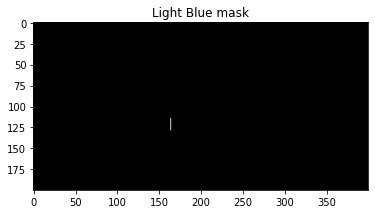

Displaying: Light Blue result


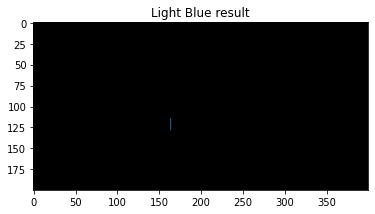

Displaying: Dark Blue mask


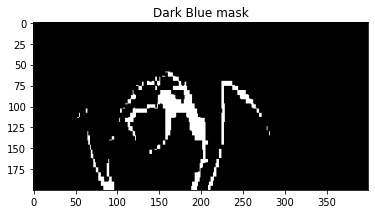

Displaying: Dark Blue result


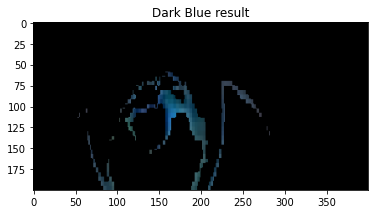

Displaying: Light Green mask


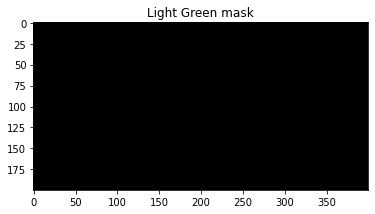

Displaying: Light Green result


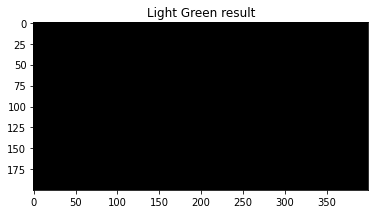

Displaying: Dark Green mask


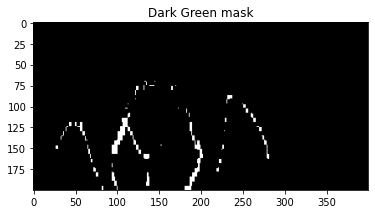

Displaying: Dark Green result


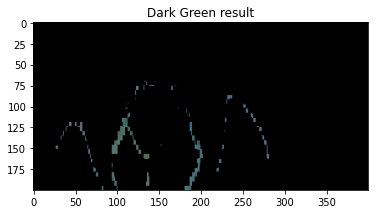

Displaying: Dark Brown mask


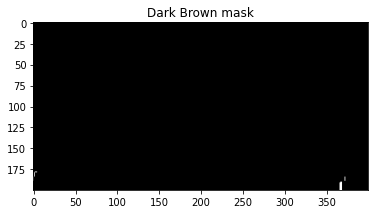

Displaying: Dark Brown result


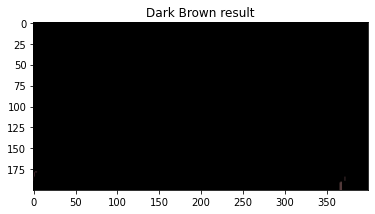

Displaying: Light Brown mask


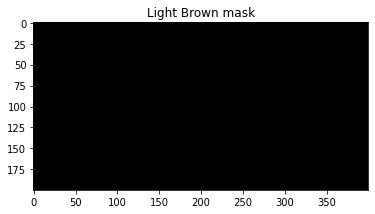

Displaying: Light Brown result


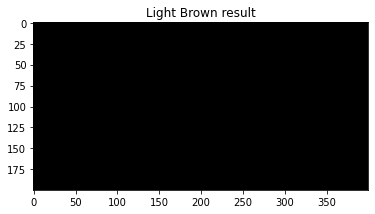

Displaying: eyeHSV


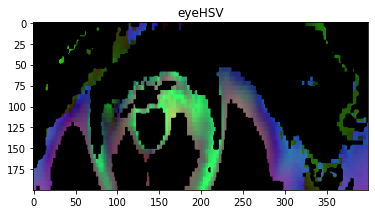

Displaying: Dark Blue maskHSV


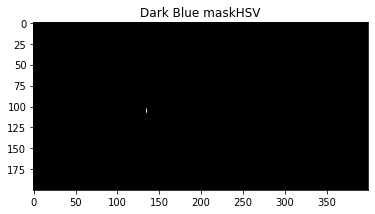

Displaying: Dark Blue resultHSV


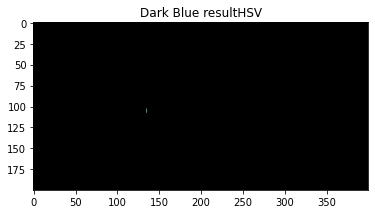

Displaying: eyeHSV


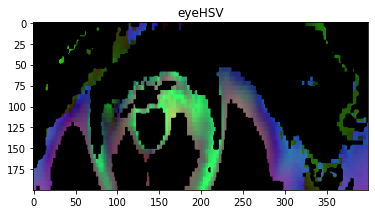

Displaying: Light Blue maskHSV


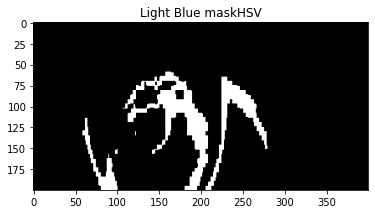

Displaying: Light Blue resultHSV


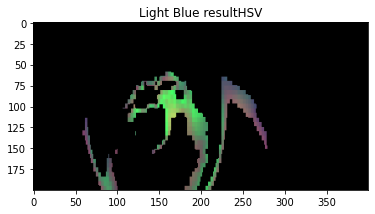

Displaying: eyeHSV


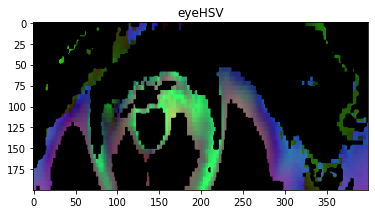

Displaying: Dark Green maskHSV


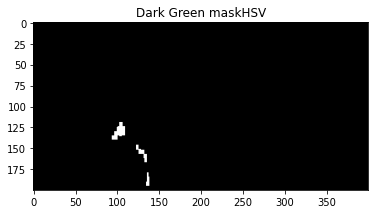

Displaying: Dark Green resultHSV


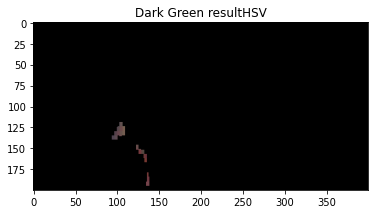

Displaying: eyeHSV


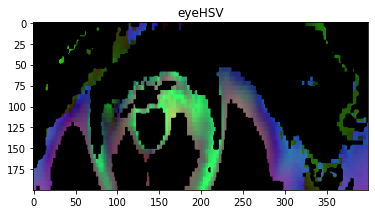

Displaying: Light Green maskHSV


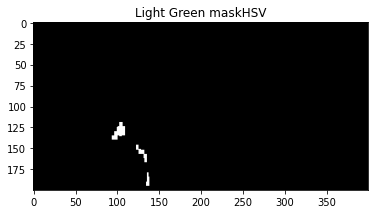

Displaying: Light Green resultHSV


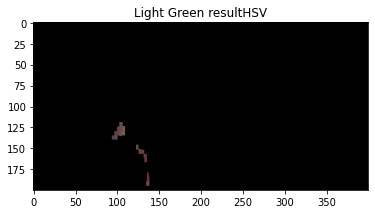

Displaying: eyeHSV


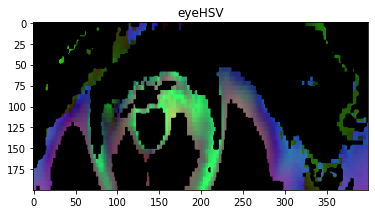

Displaying: Dark Brown maskHSV


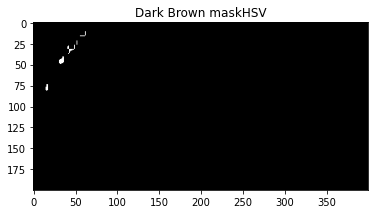

Displaying: Dark Brown resultHSV


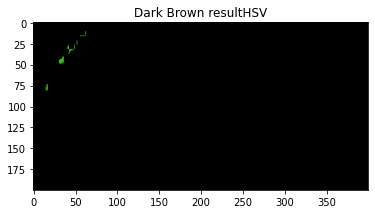

Displaying: eyeHSV


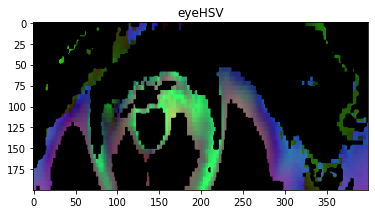

Displaying: Light Brown maskHSV


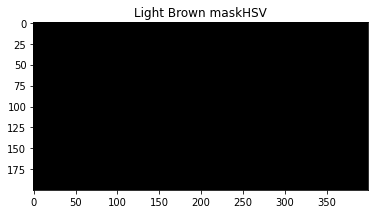

Displaying: Light Brown resultHSV


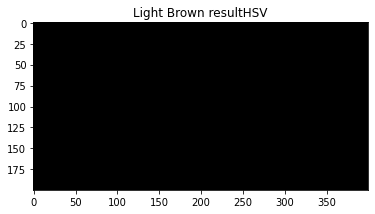

BGR Results {'Light Blue': 0.0001875, 'Dark Blue': 0.048475, 'Light Green': 0.0, 'Dark Green': 0.0169, 'Dark Brown': 0.0005875, 'Light Brown': 0.0}
HSV Results {'Dark Blue': 6.25e-05, 'Light Blue': 0.0798875, 'Dark Green': 0.0040125, 'Light Green': 0.0040125, 'Dark Brown': 0.0012375, 'Light Brown': 0.0}
BGR found Dark Blue 4.8475 %
HSV found Light Blue 7.98875 %
------------------------------
aa/images/brown (1).jpg
Displaying: Original 


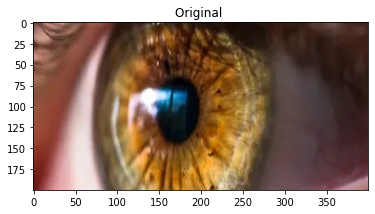

Displaying: cont


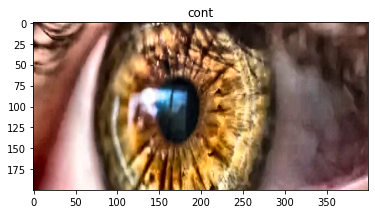

Displaying: skin_mask:


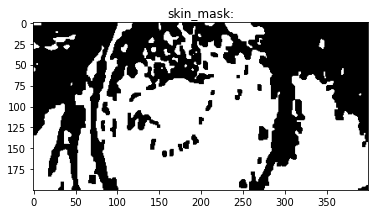

Displaying: res


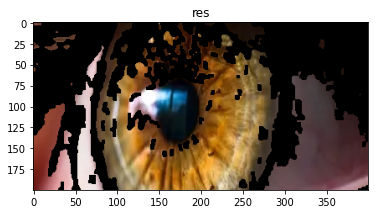

Displaying: Black mask


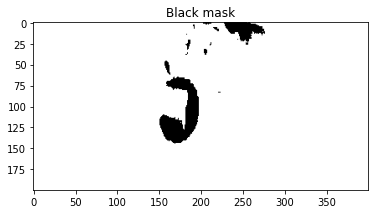

Displaying: Black Masked: 


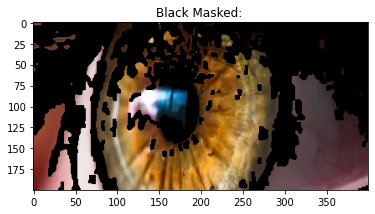

Displaying: White Mask: 


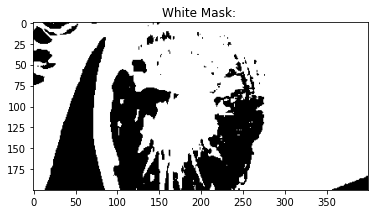

Displaying: white_masked 


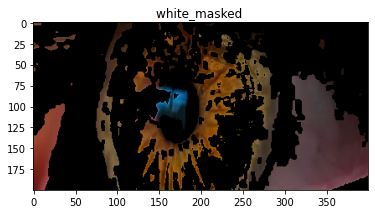

Displaying: Light Blue mask


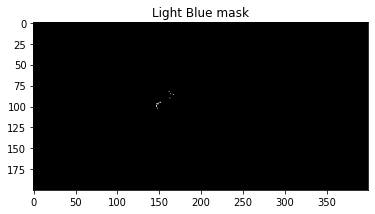

Displaying: Light Blue result


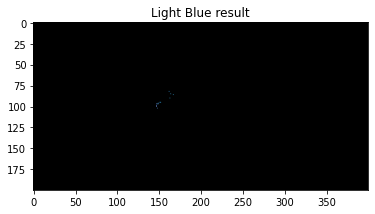

Displaying: Dark Blue mask


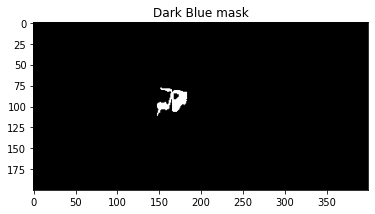

Displaying: Dark Blue result


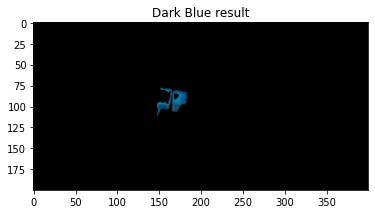

Displaying: Light Green mask


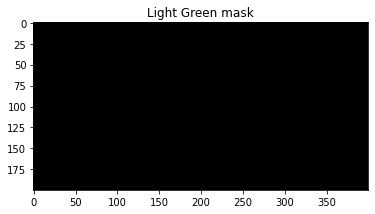

Displaying: Light Green result


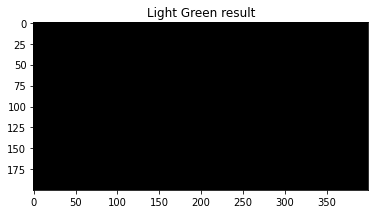

Displaying: Dark Green mask


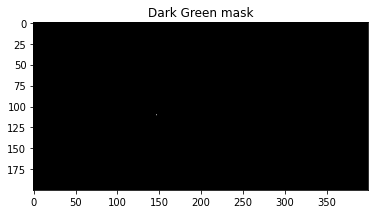

Displaying: Dark Green result


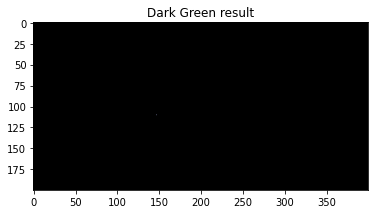

Displaying: Dark Brown mask


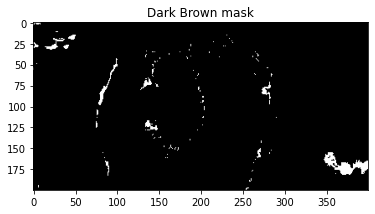

Displaying: Dark Brown result


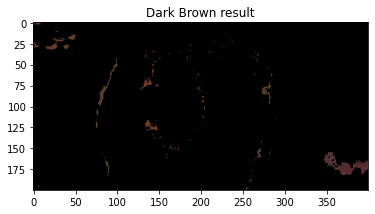

Displaying: Light Brown mask


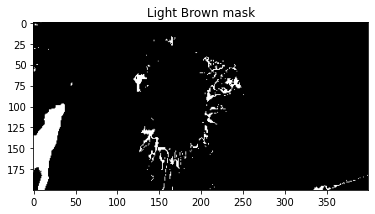

Displaying: Light Brown result


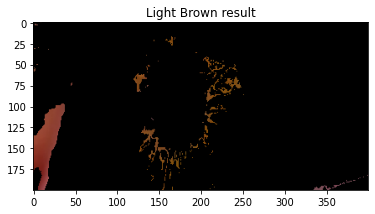

Displaying: eyeHSV


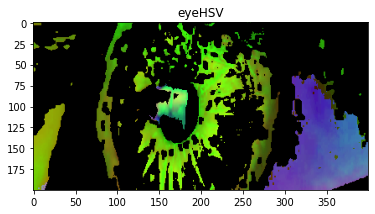

Displaying: Dark Blue maskHSV


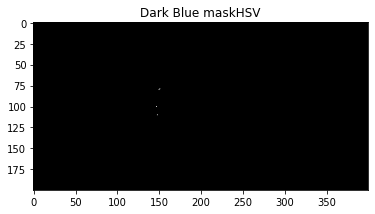

Displaying: Dark Blue resultHSV


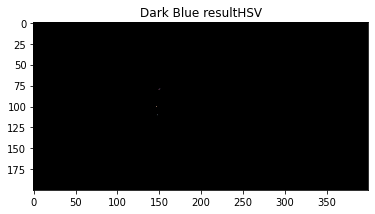

Displaying: eyeHSV


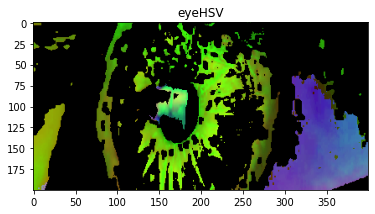

Displaying: Light Blue maskHSV


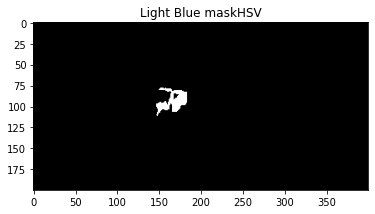

Displaying: Light Blue resultHSV


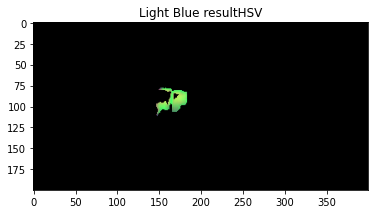

Displaying: eyeHSV


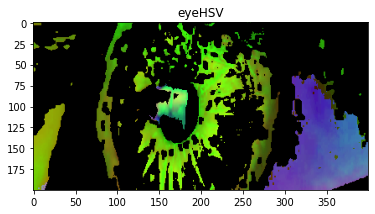

Displaying: Dark Green maskHSV


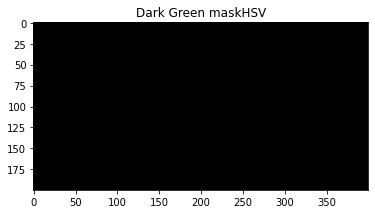

Displaying: Dark Green resultHSV


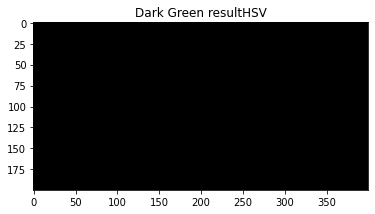

Displaying: eyeHSV


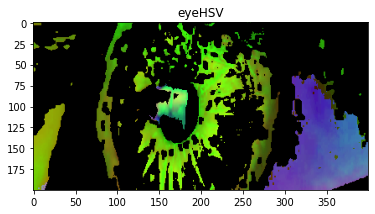

Displaying: Light Green maskHSV


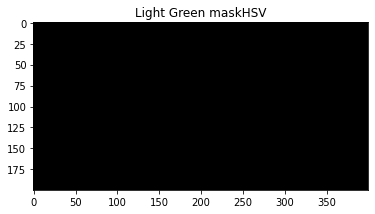

Displaying: Light Green resultHSV


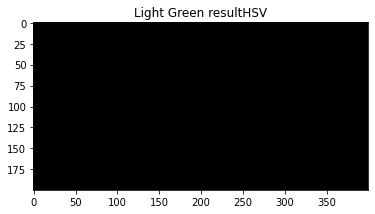

Displaying: eyeHSV


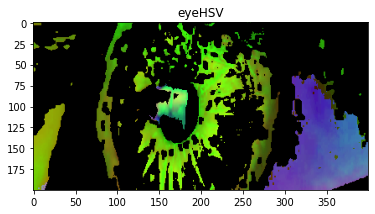

Displaying: Dark Brown maskHSV


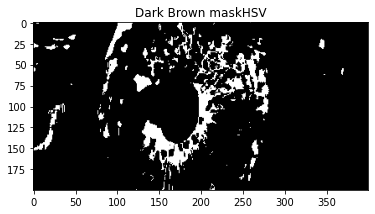

Displaying: Dark Brown resultHSV


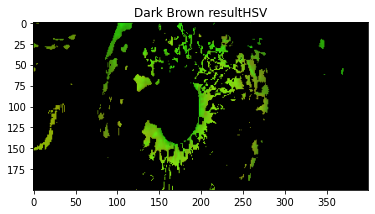

Displaying: eyeHSV


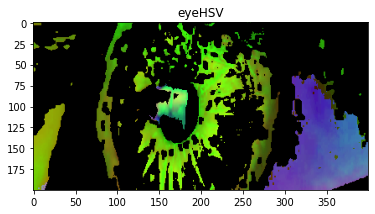

Displaying: Light Brown maskHSV


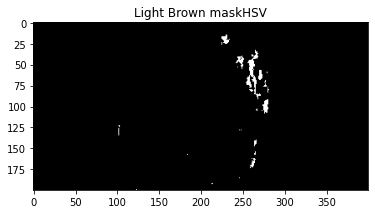

Displaying: Light Brown resultHSV


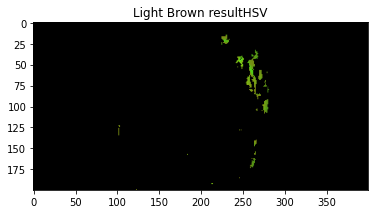

BGR Results {'Light Blue': 0.0001625, 'Dark Blue': 0.00675, 'Light Green': 0.0, 'Dark Green': 1.25e-05, 'Dark Brown': 0.0176125, 'Light Brown': 0.041725}
HSV Results {'Dark Blue': 5e-05, 'Light Blue': 0.0074625, 'Dark Green': 0.0, 'Light Green': 0.0, 'Dark Brown': 0.088275, 'Light Brown': 0.0079875}
BGR found Light Brown 4.172499999999999 %
HSV found Dark Brown 8.8275 %
------------------------------
aa/images/brown (4).jpg
Displaying: Original 


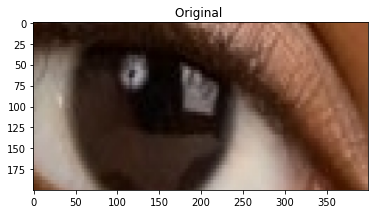

Displaying: cont


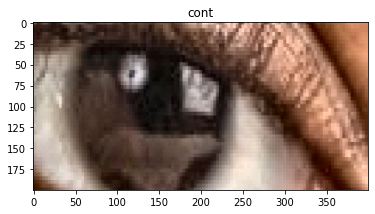

Displaying: skin_mask:


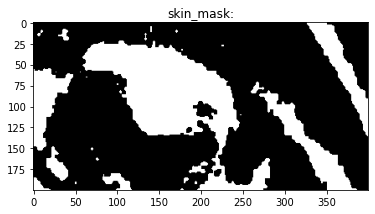

Displaying: res


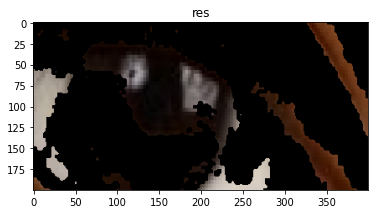

Displaying: Black mask


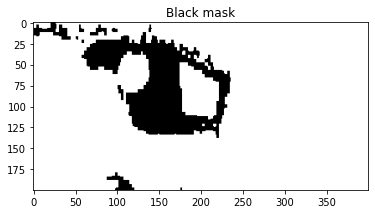

Displaying: Black Masked: 


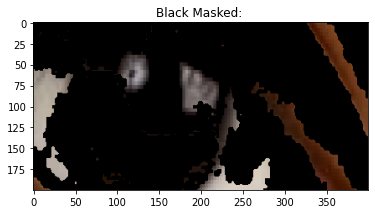

Displaying: White Mask: 


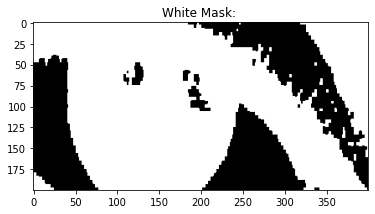

Displaying: white_masked 


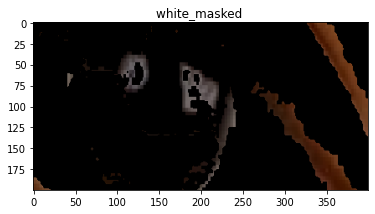

Displaying: Light Blue mask


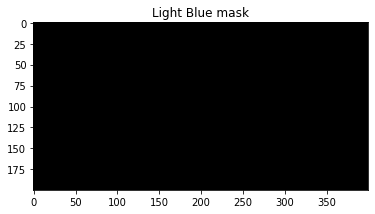

Displaying: Light Blue result


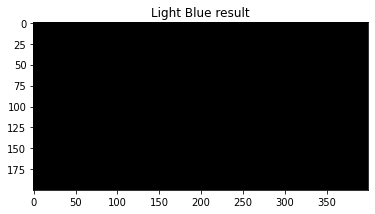

Displaying: Dark Blue mask


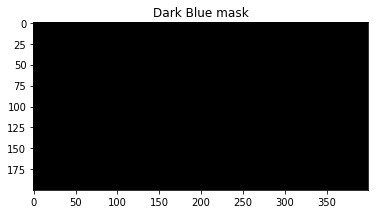

Displaying: Dark Blue result


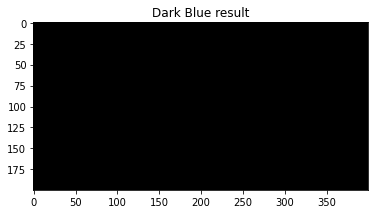

Displaying: Light Green mask


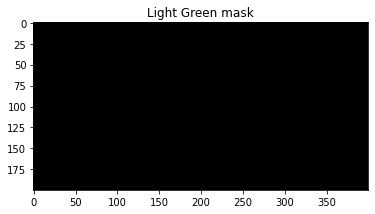

Displaying: Light Green result


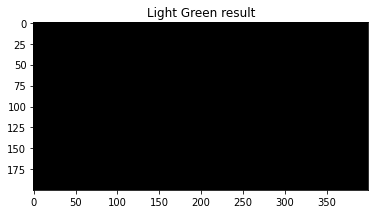

Displaying: Dark Green mask


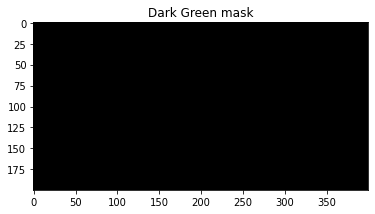

Displaying: Dark Green result


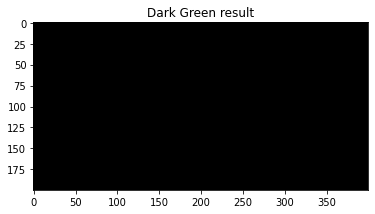

Displaying: Dark Brown mask


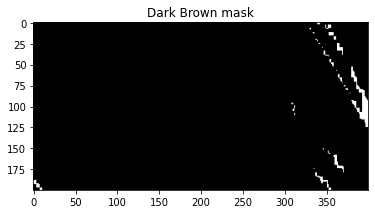

Displaying: Dark Brown result


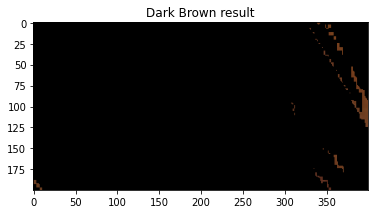

Displaying: Light Brown mask


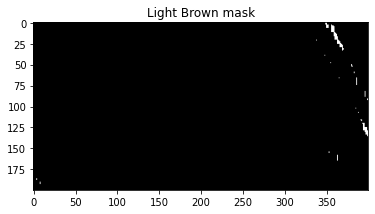

Displaying: Light Brown result


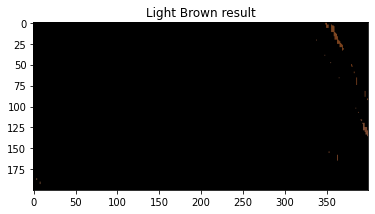

Displaying: eyeHSV


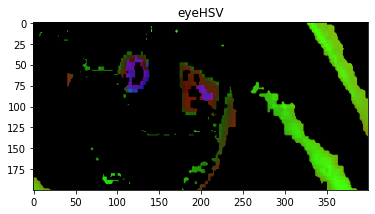

Displaying: Dark Blue maskHSV


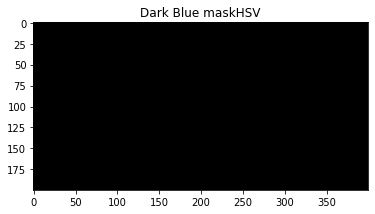

Displaying: Dark Blue resultHSV


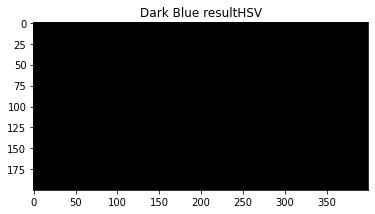

Displaying: eyeHSV


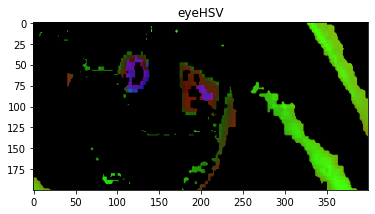

Displaying: Light Blue maskHSV


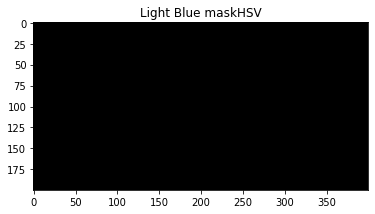

Displaying: Light Blue resultHSV


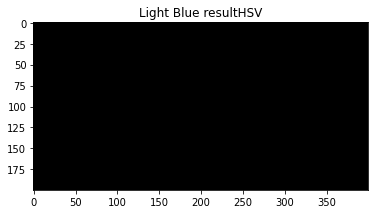

Displaying: eyeHSV


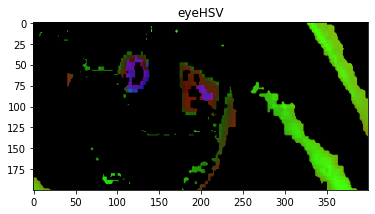

Displaying: Dark Green maskHSV


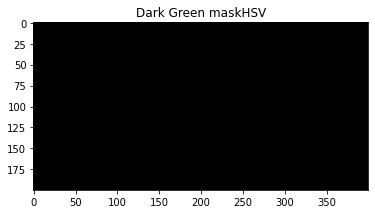

Displaying: Dark Green resultHSV


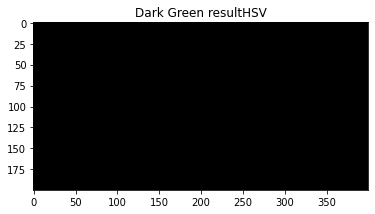

Displaying: eyeHSV


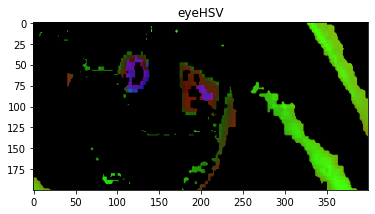

Displaying: Light Green maskHSV


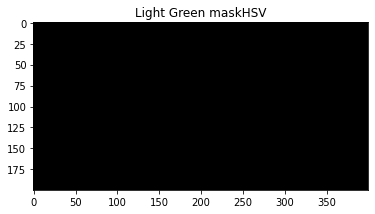

Displaying: Light Green resultHSV


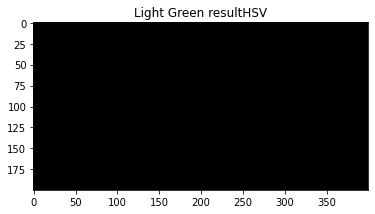

Displaying: eyeHSV


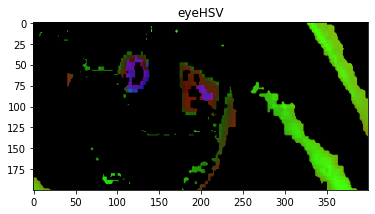

Displaying: Dark Brown maskHSV


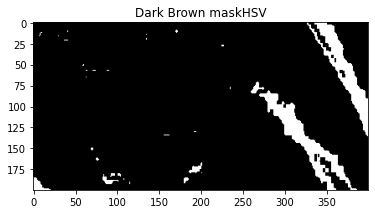

Displaying: Dark Brown resultHSV


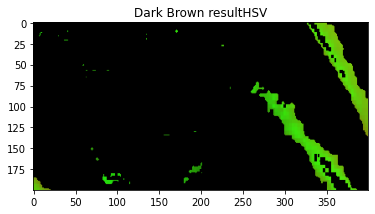

Displaying: eyeHSV


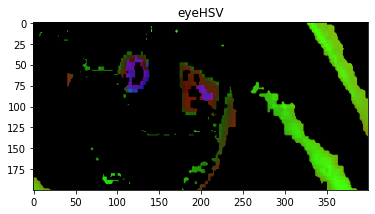

Displaying: Light Brown maskHSV


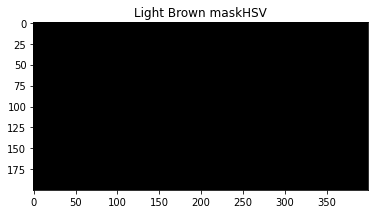

Displaying: Light Brown resultHSV


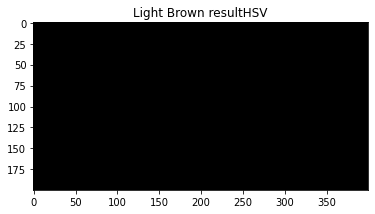

BGR Results {'Light Blue': 0.0, 'Dark Blue': 0.0, 'Light Green': 0.0, 'Dark Green': 0.0, 'Dark Brown': 0.010325, 'Light Brown': 0.0027375}
HSV Results {'Dark Blue': 0.0, 'Light Blue': 0.0, 'Dark Green': 0.0, 'Light Green': 0.0, 'Dark Brown': 0.06735, 'Light Brown': 0.0}
BGR found Dark Brown 1.0325000000000002 %
HSV found Dark Brown 6.734999999999999 %
------------------------------
aa/images/brown (2).jpg
Displaying: Original 


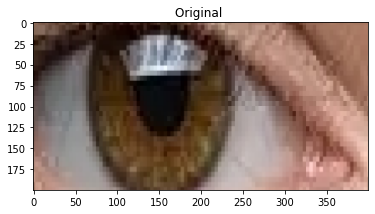

Displaying: cont


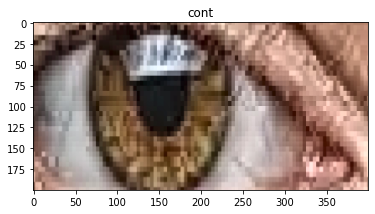

Displaying: skin_mask:


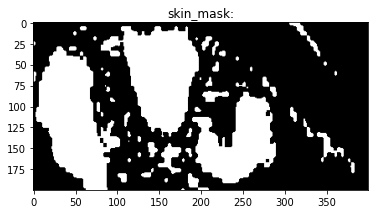

Displaying: res


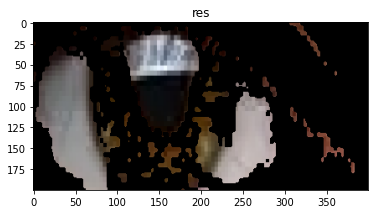

Displaying: Black mask


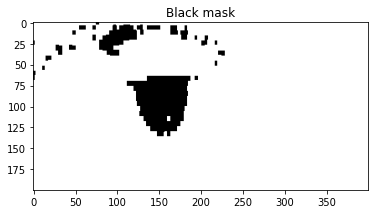

Displaying: Black Masked: 


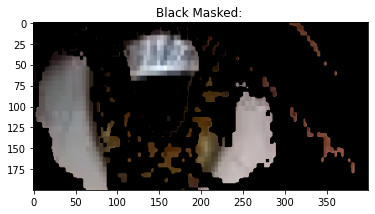

Displaying: White Mask: 


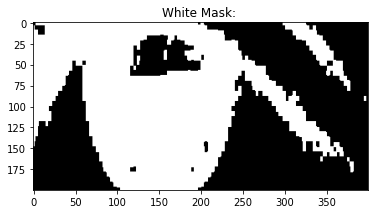

Displaying: white_masked 


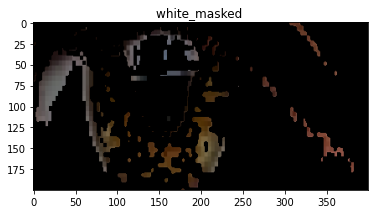

Displaying: Light Blue mask


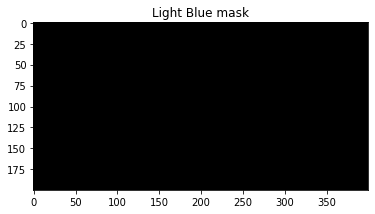

Displaying: Light Blue result


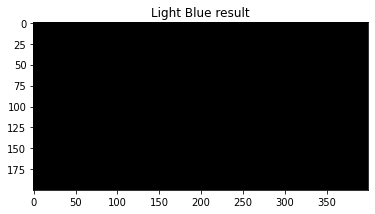

Displaying: Dark Blue mask


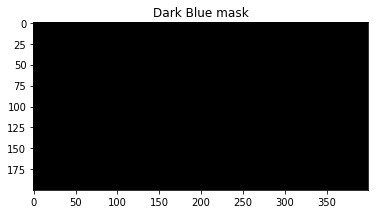

Displaying: Dark Blue result


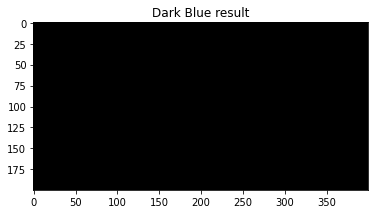

Displaying: Light Green mask


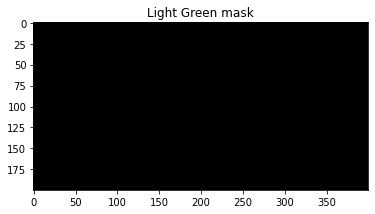

Displaying: Light Green result


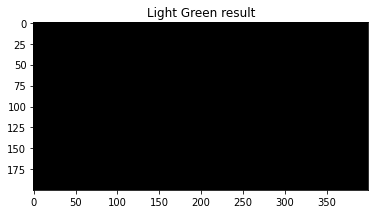

Displaying: Dark Green mask


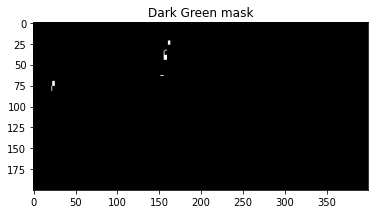

Displaying: Dark Green result


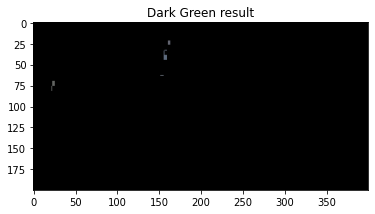

Displaying: Dark Brown mask


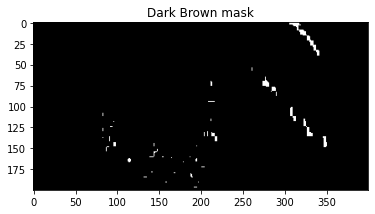

Displaying: Dark Brown result


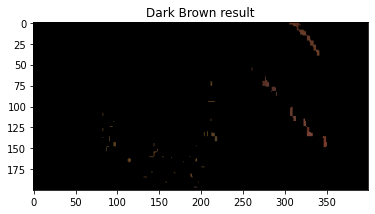

Displaying: Light Brown mask


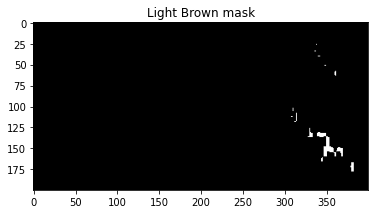

Displaying: Light Brown result


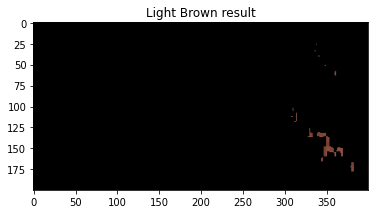

Displaying: eyeHSV


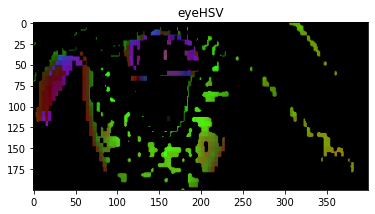

Displaying: Dark Blue maskHSV


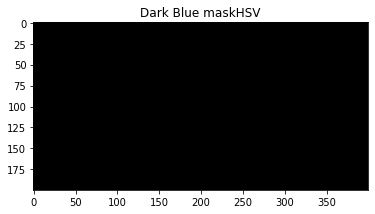

Displaying: Dark Blue resultHSV


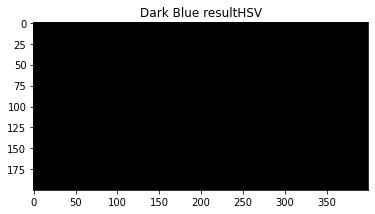

Displaying: eyeHSV


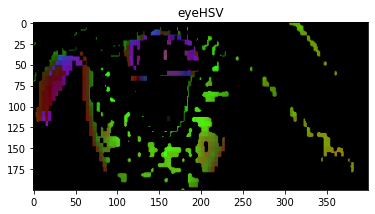

Displaying: Light Blue maskHSV


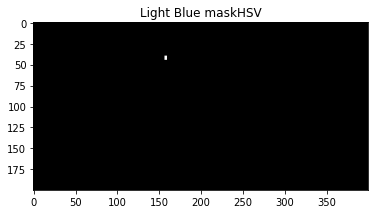

Displaying: Light Blue resultHSV


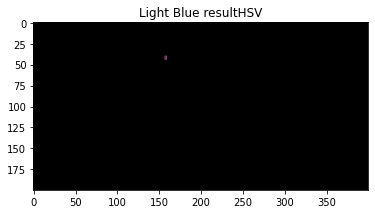

Displaying: eyeHSV


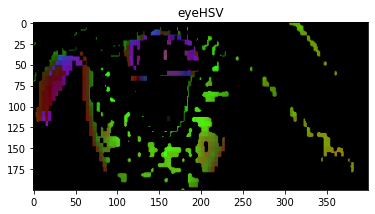

Displaying: Dark Green maskHSV


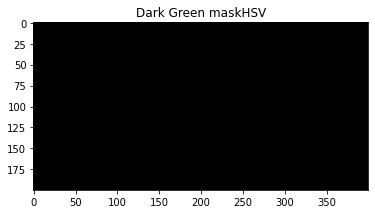

Displaying: Dark Green resultHSV


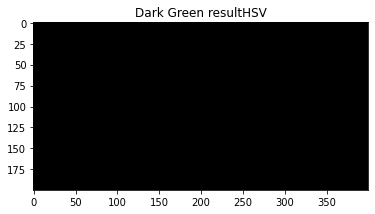

Displaying: eyeHSV


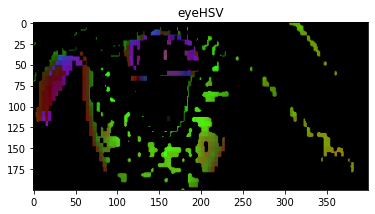

Displaying: Light Green maskHSV


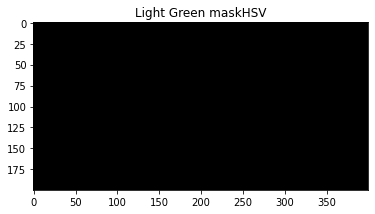

Displaying: Light Green resultHSV


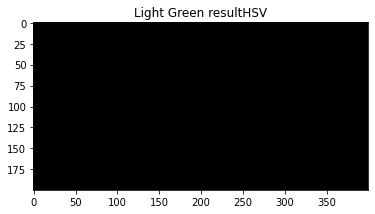

Displaying: eyeHSV


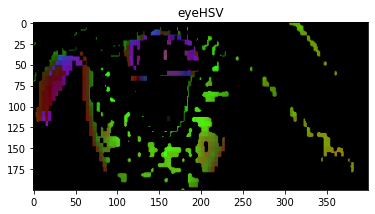

Displaying: Dark Brown maskHSV


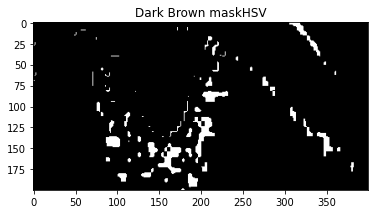

Displaying: Dark Brown resultHSV


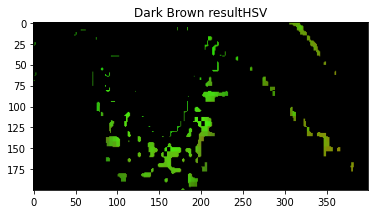

Displaying: eyeHSV


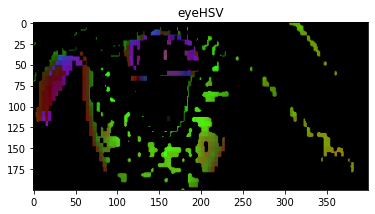

Displaying: Light Brown maskHSV


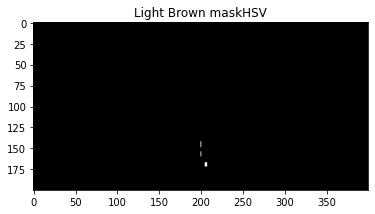

Displaying: Light Brown resultHSV


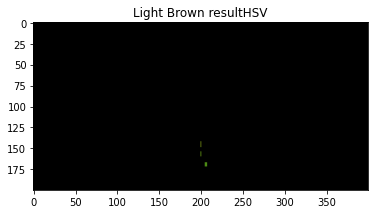

BGR Results {'Light Blue': 0.0, 'Dark Blue': 0.0, 'Light Green': 0.0, 'Dark Green': 0.0009375, 'Dark Brown': 0.0082125, 'Light Brown': 0.0045125}
HSV Results {'Dark Blue': 0.0, 'Light Blue': 0.0001875, 'Dark Green': 0.0, 'Light Green': 0.0, 'Dark Brown': 0.0436625, 'Light Brown': 0.00035}
BGR found Dark Brown 0.8212499999999999 %
HSV found Dark Brown 4.36625 %
------------------------------
aa/images/blue (1).jpg
Displaying: Original 


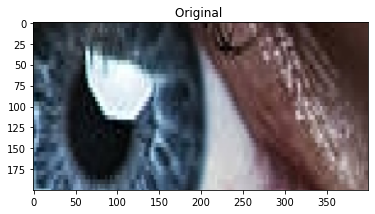

Displaying: cont


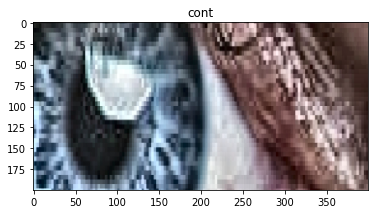

Displaying: skin_mask:


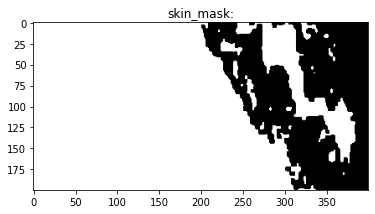

Displaying: res


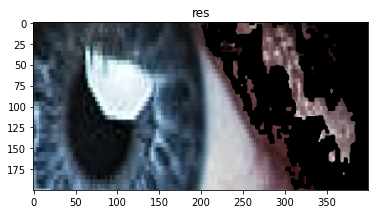

Displaying: Black mask


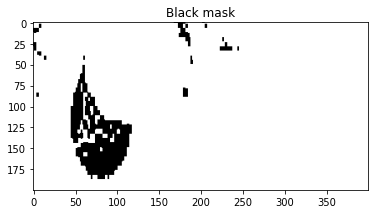

Displaying: Black Masked: 


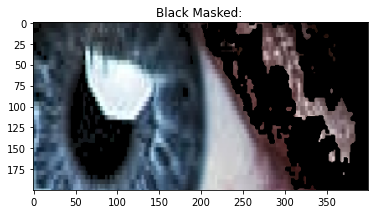

Displaying: White Mask: 


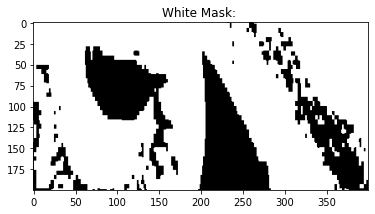

Displaying: white_masked 


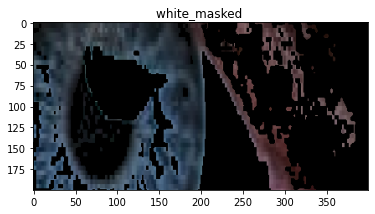

Displaying: Light Blue mask


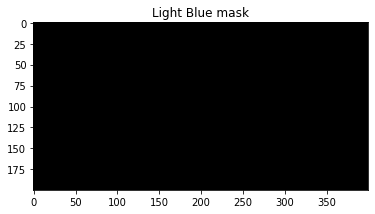

Displaying: Light Blue result


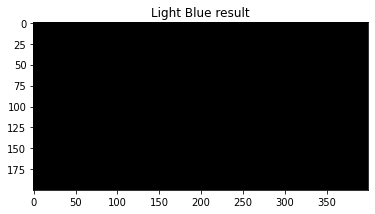

Displaying: Dark Blue mask


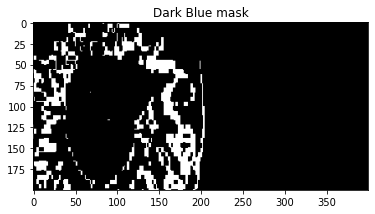

Displaying: Dark Blue result


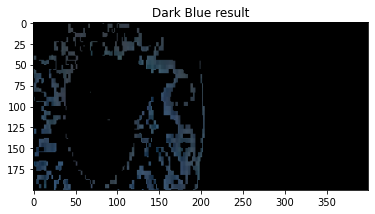

Displaying: Light Green mask


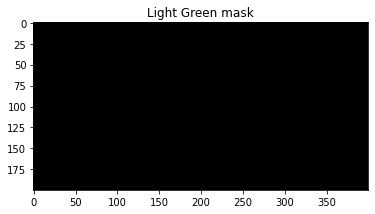

Displaying: Light Green result


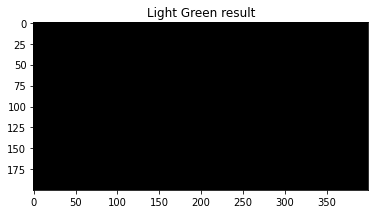

Displaying: Dark Green mask


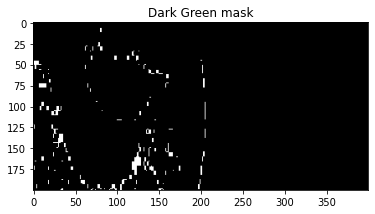

Displaying: Dark Green result


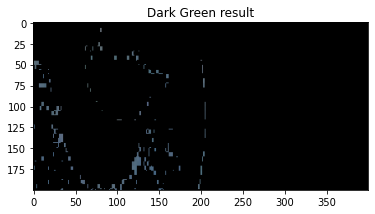

Displaying: Dark Brown mask


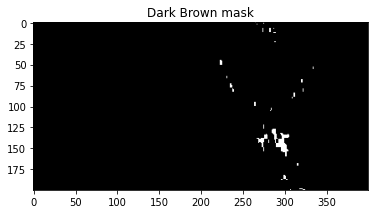

Displaying: Dark Brown result


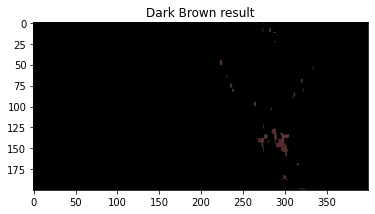

Displaying: Light Brown mask


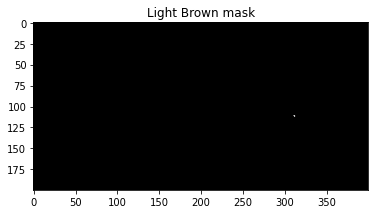

Displaying: Light Brown result


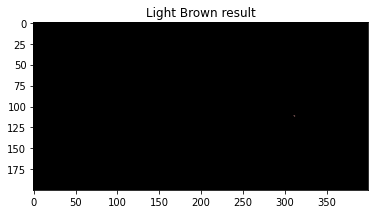

Displaying: eyeHSV


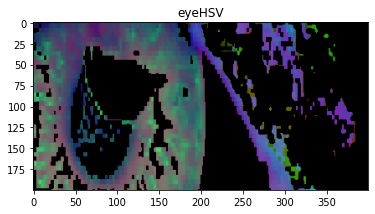

Displaying: Dark Blue maskHSV


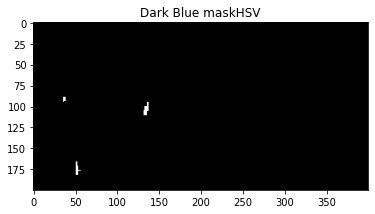

Displaying: Dark Blue resultHSV


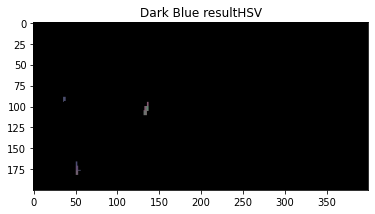

Displaying: eyeHSV


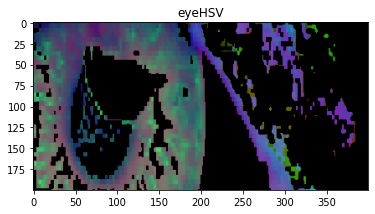

Displaying: Light Blue maskHSV


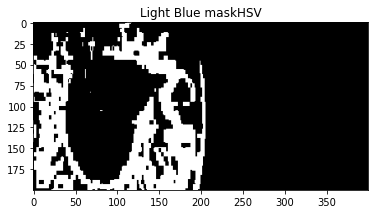

Displaying: Light Blue resultHSV


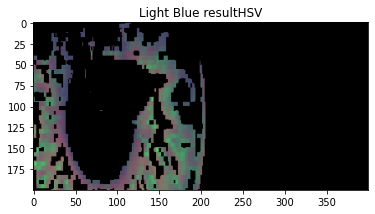

Displaying: eyeHSV


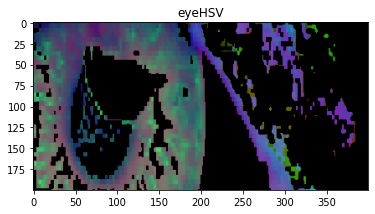

Displaying: Dark Green maskHSV


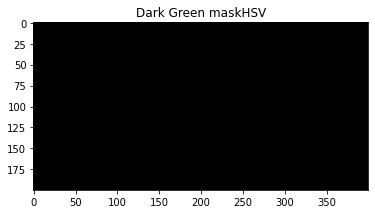

Displaying: Dark Green resultHSV


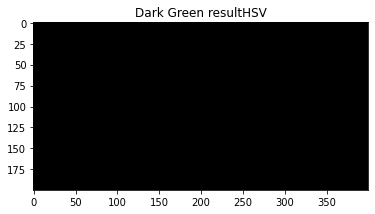

Displaying: eyeHSV


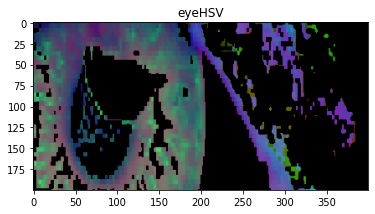

Displaying: Light Green maskHSV


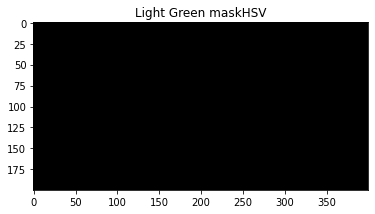

Displaying: Light Green resultHSV


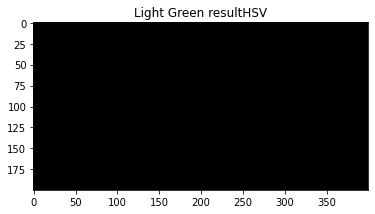

Displaying: eyeHSV


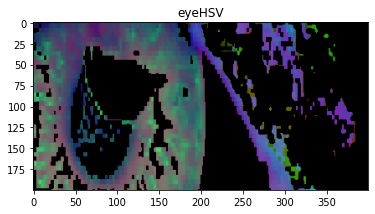

Displaying: Dark Brown maskHSV


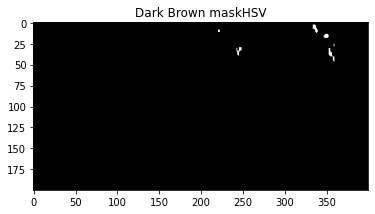

Displaying: Dark Brown resultHSV


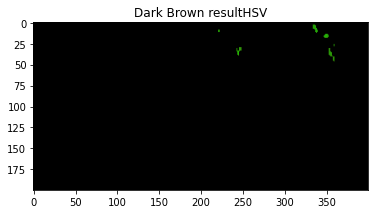

Displaying: eyeHSV


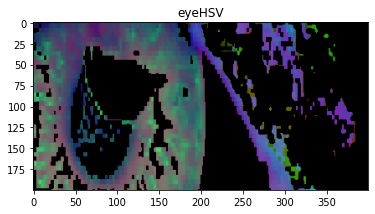

Displaying: Light Brown maskHSV


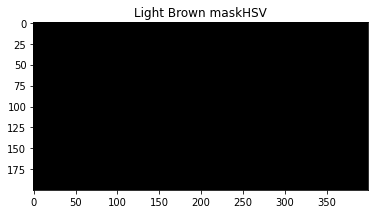

Displaying: Light Brown resultHSV


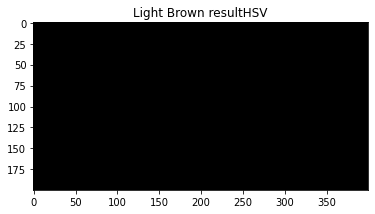

BGR Results {'Light Blue': 0.0, 'Dark Blue': 0.1053, 'Light Green': 0.0, 'Dark Green': 0.0164625, 'Dark Brown': 0.005925, 'Light Brown': 3.75e-05}
HSV Results {'Dark Blue': 0.0015375, 'Light Blue': 0.1982125, 'Dark Green': 0.0, 'Light Green': 0.0, 'Dark Brown': 0.001675, 'Light Brown': 0.0}
BGR found Dark Blue 10.530000000000001 %
HSV found Light Blue 19.821250000000003 %
------------------------------
aa/images/blue (6).jpg
Displaying: Original 


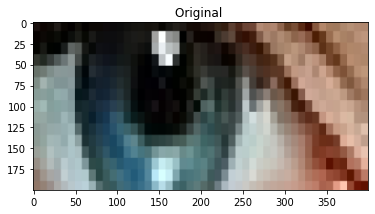

Displaying: cont


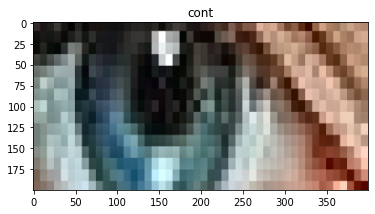

Displaying: skin_mask:


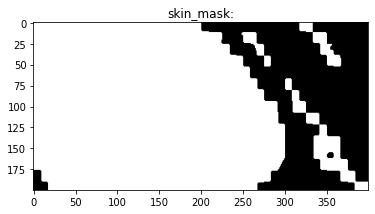

Displaying: res


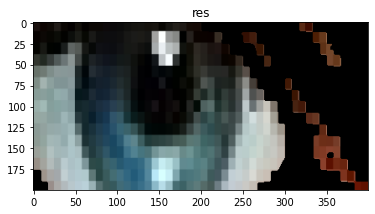

Displaying: Black mask


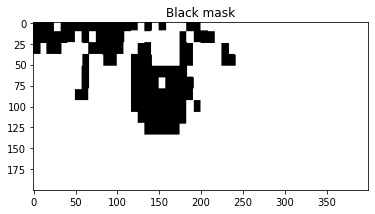

Displaying: Black Masked: 


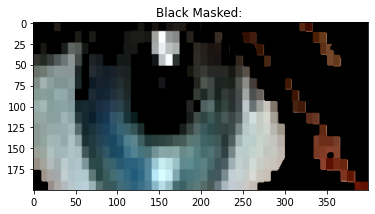

Displaying: White Mask: 


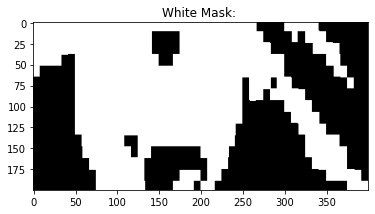

Displaying: white_masked 


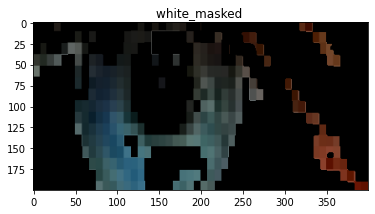

Displaying: Light Blue mask


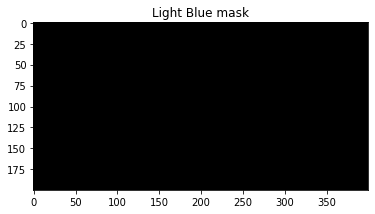

Displaying: Light Blue result


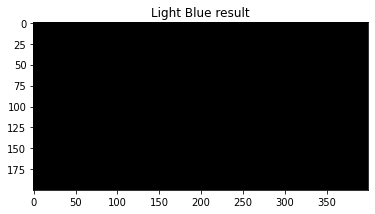

Displaying: Dark Blue mask


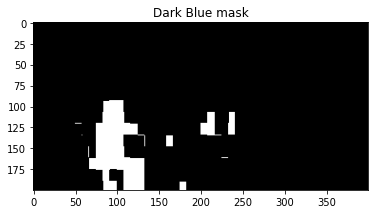

Displaying: Dark Blue result


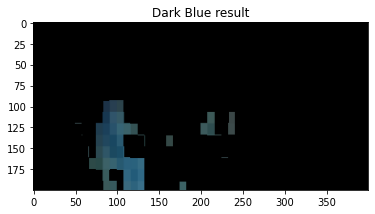

Displaying: Light Green mask


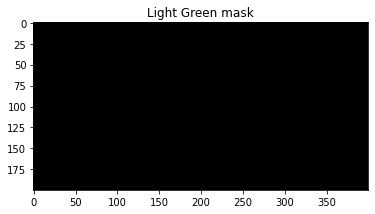

Displaying: Light Green result


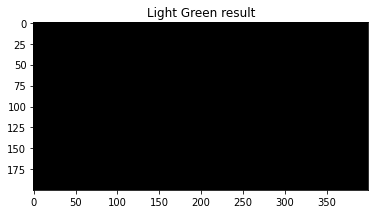

Displaying: Dark Green mask


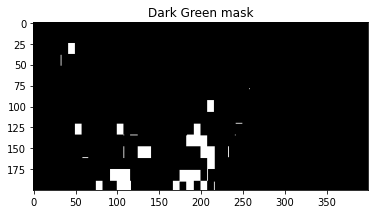

Displaying: Dark Green result


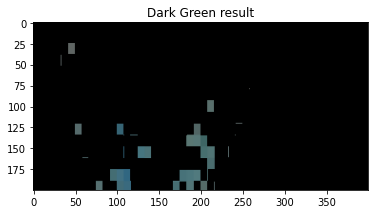

Displaying: Dark Brown mask


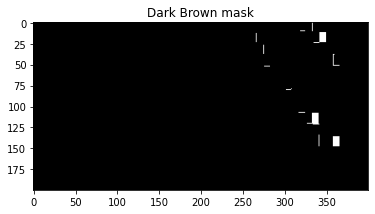

Displaying: Dark Brown result


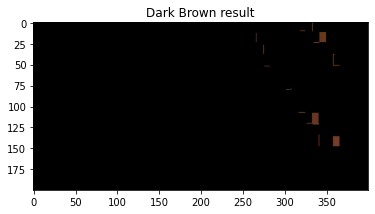

Displaying: Light Brown mask


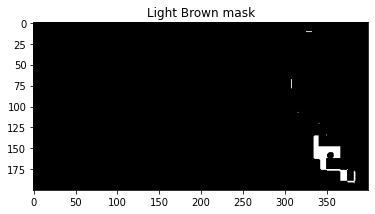

Displaying: Light Brown result


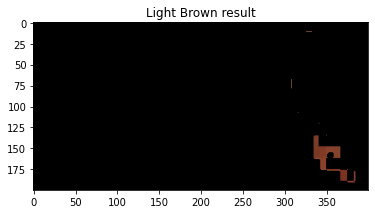

Displaying: eyeHSV


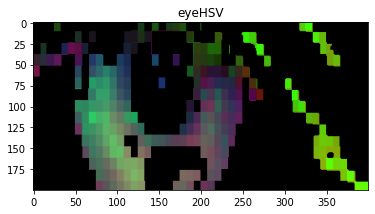

Displaying: Dark Blue maskHSV


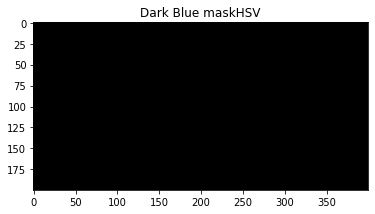

Displaying: Dark Blue resultHSV


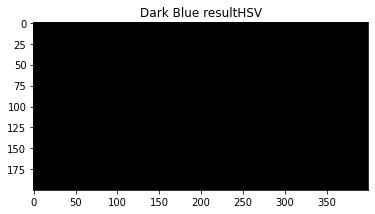

Displaying: eyeHSV


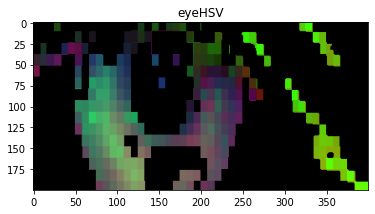

Displaying: Light Blue maskHSV


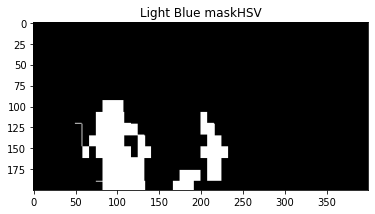

Displaying: Light Blue resultHSV


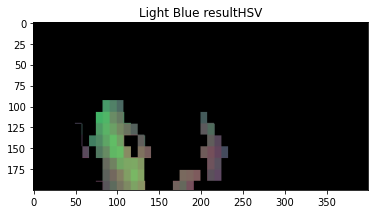

Displaying: eyeHSV


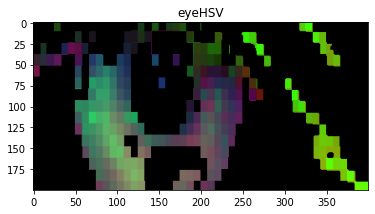

Displaying: Dark Green maskHSV


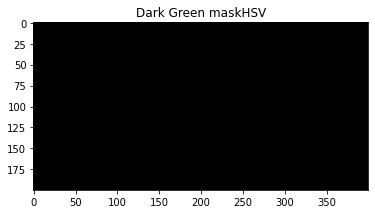

Displaying: Dark Green resultHSV


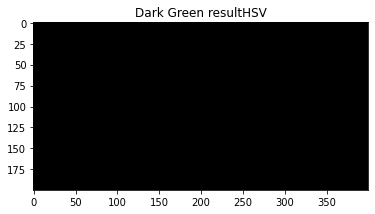

Displaying: eyeHSV


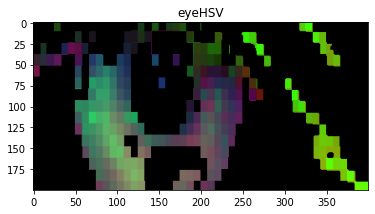

Displaying: Light Green maskHSV


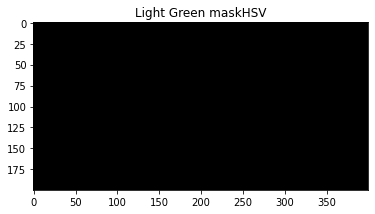

Displaying: Light Green resultHSV


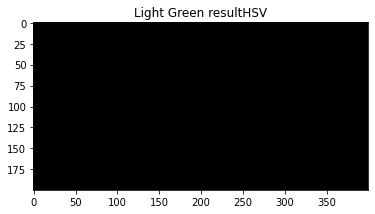

Displaying: eyeHSV


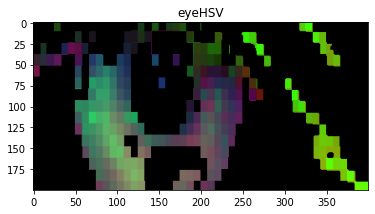

Displaying: Dark Brown maskHSV


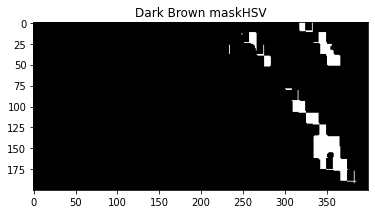

Displaying: Dark Brown resultHSV


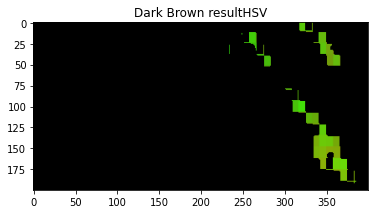

Displaying: eyeHSV


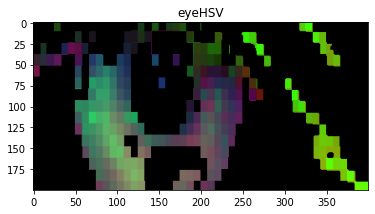

Displaying: Light Brown maskHSV


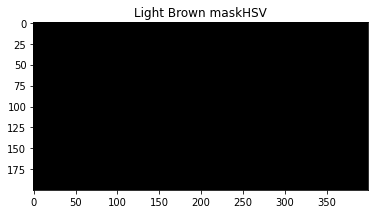

Displaying: Light Brown resultHSV


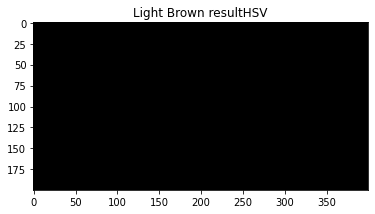

BGR Results {'Light Blue': 0.0, 'Dark Blue': 0.0612625, 'Light Green': 0.0, 'Dark Green': 0.034475, 'Dark Brown': 0.005175, 'Light Brown': 0.0097625}
HSV Results {'Dark Blue': 0.0, 'Light Blue': 0.0897875, 'Dark Green': 0.0, 'Light Green': 0.0, 'Dark Brown': 0.033975, 'Light Brown': 0.0}
BGR found Dark Blue 6.12625 %
HSV found Light Blue 8.97875 %
------------------------------
aa/images/blue (5).jpg
Displaying: Original 


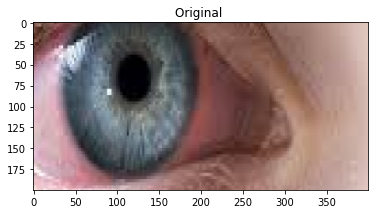

Displaying: cont


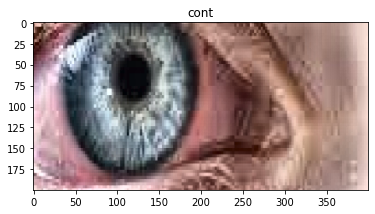

Displaying: skin_mask:


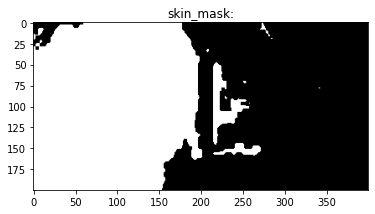

Displaying: res


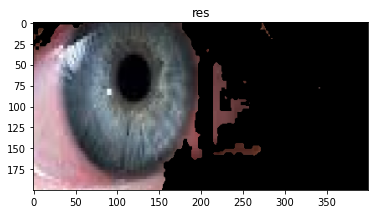

Displaying: Black mask


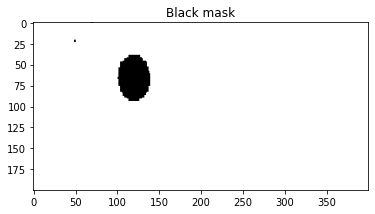

Displaying: Black Masked: 


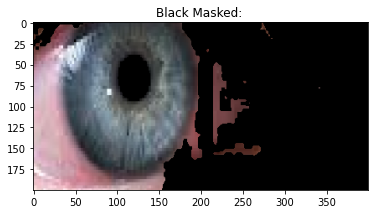

Displaying: White Mask: 


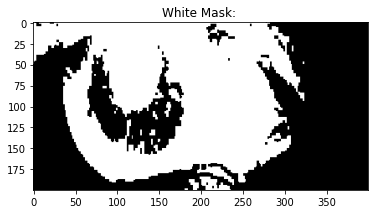

Displaying: white_masked 


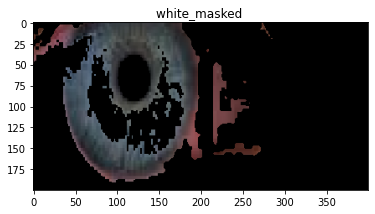

Displaying: Light Blue mask


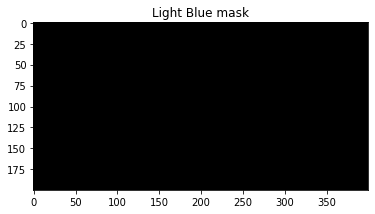

Displaying: Light Blue result


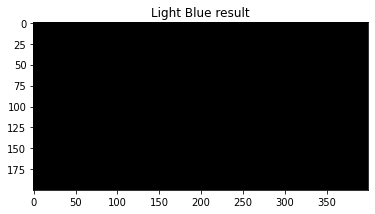

Displaying: Dark Blue mask


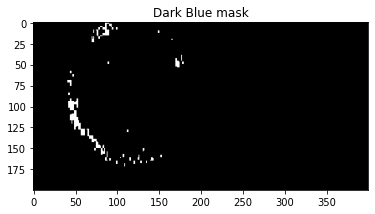

Displaying: Dark Blue result


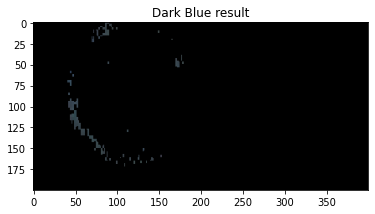

Displaying: Light Green mask


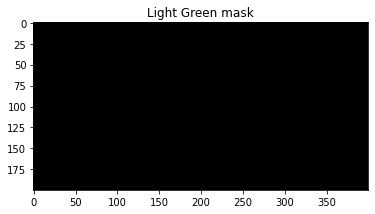

Displaying: Light Green result


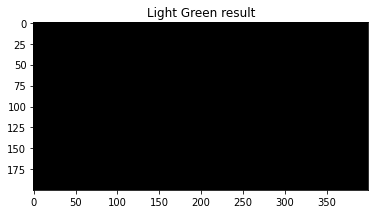

Displaying: Dark Green mask


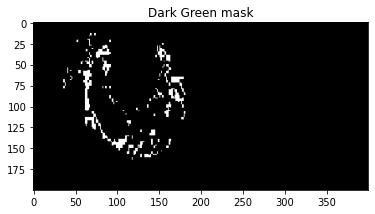

Displaying: Dark Green result


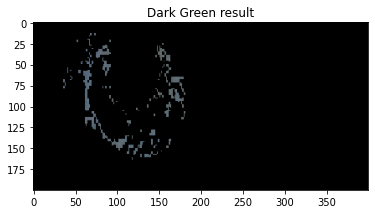

Displaying: Dark Brown mask


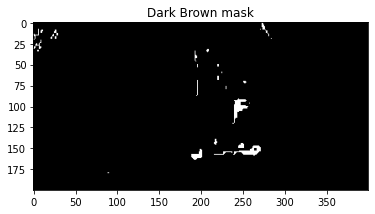

Displaying: Dark Brown result


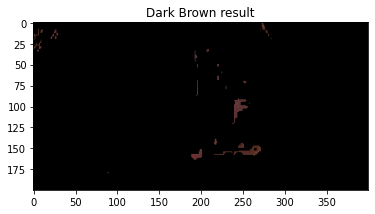

Displaying: Light Brown mask


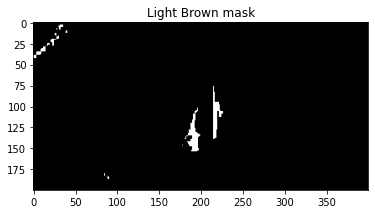

Displaying: Light Brown result


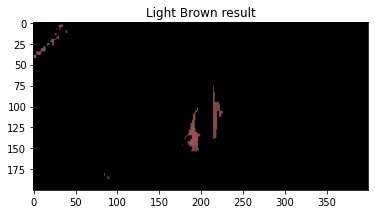

Displaying: eyeHSV


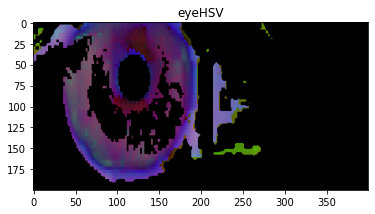

Displaying: Dark Blue maskHSV


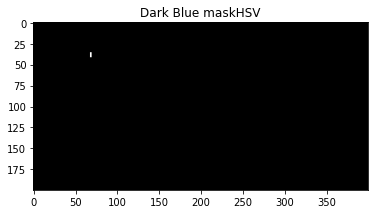

Displaying: Dark Blue resultHSV


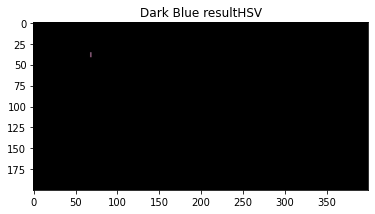

Displaying: eyeHSV


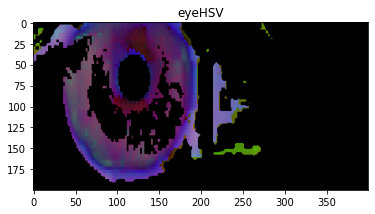

Displaying: Light Blue maskHSV


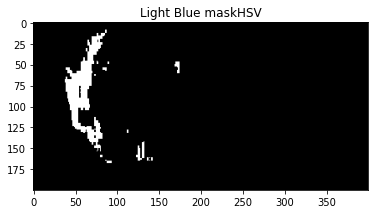

Displaying: Light Blue resultHSV


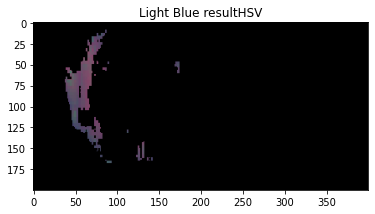

Displaying: eyeHSV


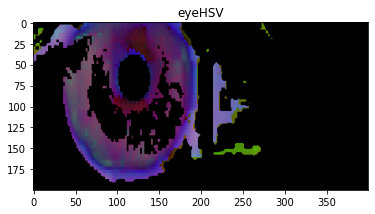

Displaying: Dark Green maskHSV


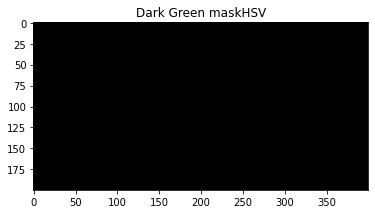

Displaying: Dark Green resultHSV


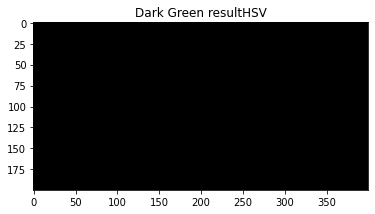

Displaying: eyeHSV


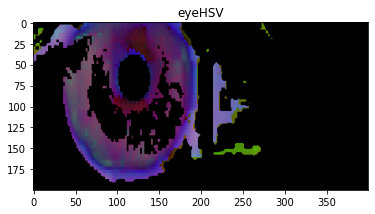

Displaying: Light Green maskHSV


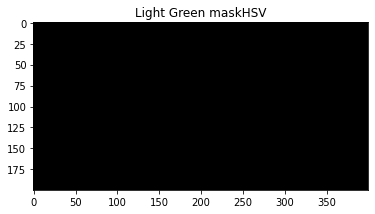

Displaying: Light Green resultHSV


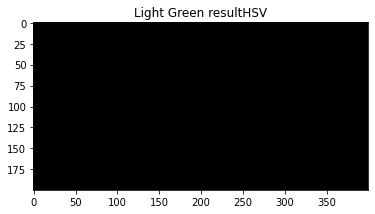

Displaying: eyeHSV


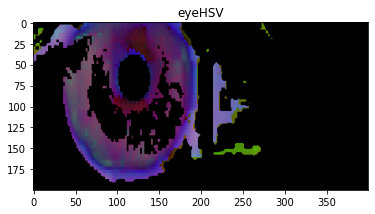

Displaying: Dark Brown maskHSV


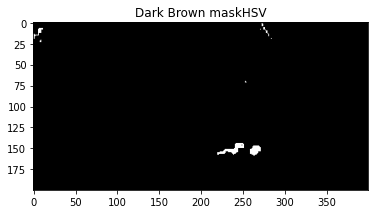

Displaying: Dark Brown resultHSV


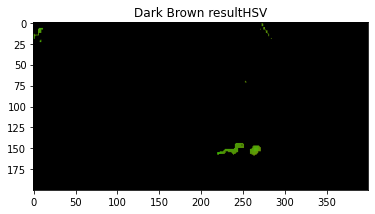

Displaying: eyeHSV


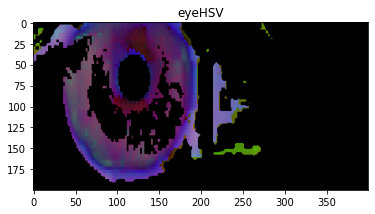

Displaying: Light Brown maskHSV


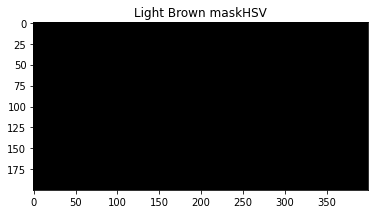

Displaying: Light Brown resultHSV


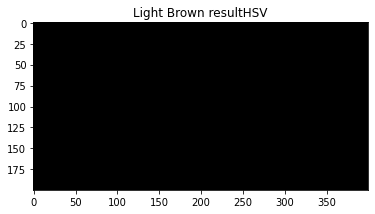

BGR Results {'Light Blue': 0.0, 'Dark Blue': 0.0102125, 'Light Green': 0.0, 'Dark Green': 0.02395, 'Dark Brown': 0.00965, 'Light Brown': 0.00995}
HSV Results {'Dark Blue': 0.00015, 'Light Blue': 0.0326875, 'Dark Green': 0.0, 'Light Green': 0.0, 'Dark Brown': 0.00455, 'Light Brown': 0.0}
BGR found Dark Green 2.395 %
HSV found Light Blue 3.2687500000000003 %
------------------------------
aa/images/blue (2).jpg
Displaying: Original 


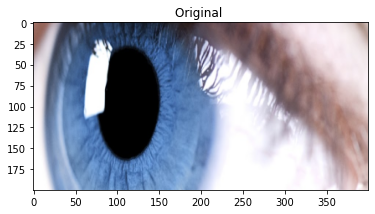

Displaying: cont


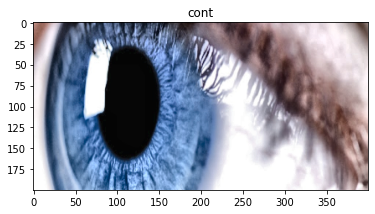

Displaying: skin_mask:


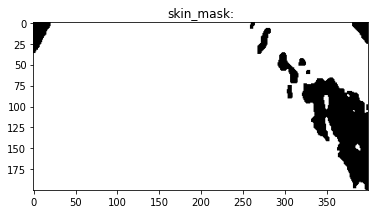

Displaying: res


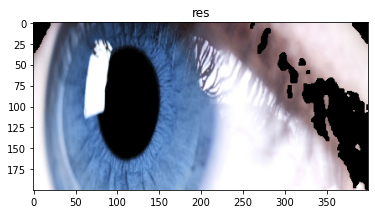

Displaying: Black mask


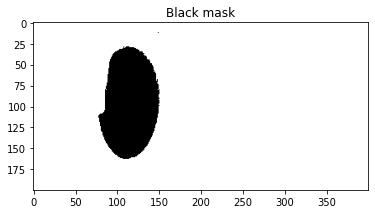

Displaying: Black Masked: 


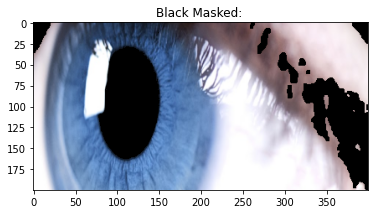

Displaying: White Mask: 


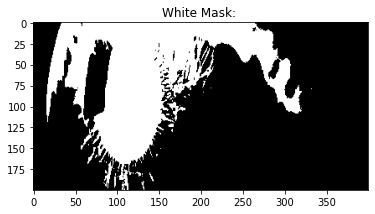

Displaying: white_masked 


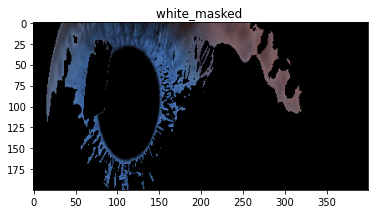

Displaying: Light Blue mask


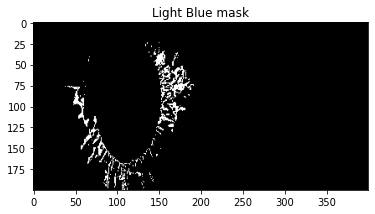

Displaying: Light Blue result


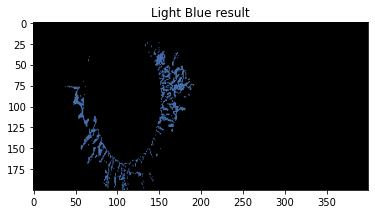

Displaying: Dark Blue mask


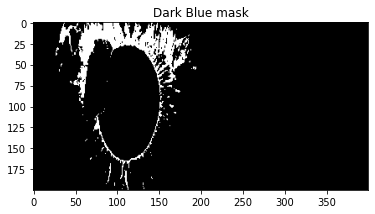

Displaying: Dark Blue result


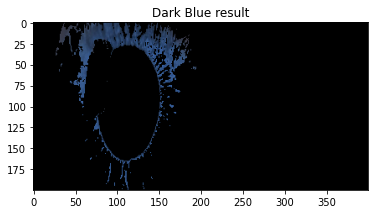

Displaying: Light Green mask


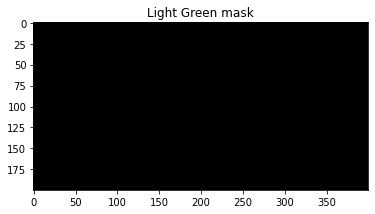

Displaying: Light Green result


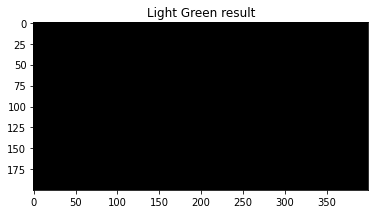

Displaying: Dark Green mask


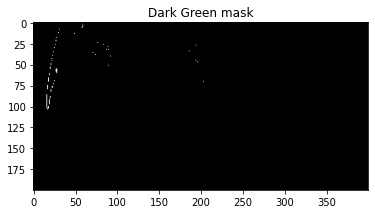

Displaying: Dark Green result


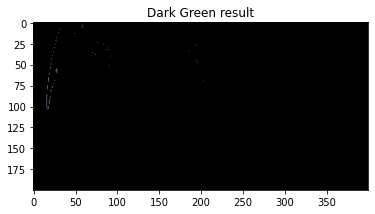

Displaying: Dark Brown mask


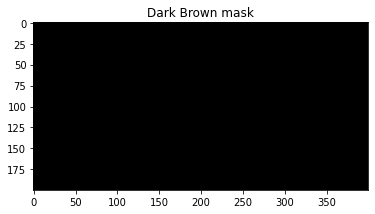

Displaying: Dark Brown result


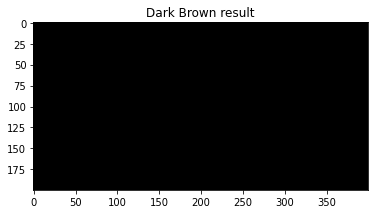

Displaying: Light Brown mask


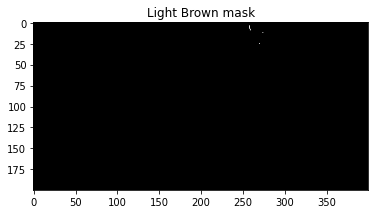

Displaying: Light Brown result


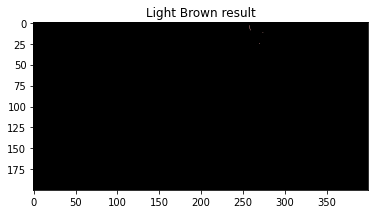

Displaying: eyeHSV


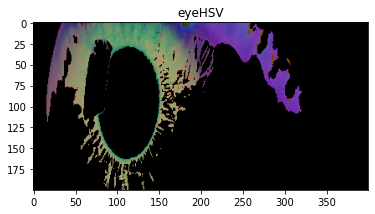

Displaying: Dark Blue maskHSV


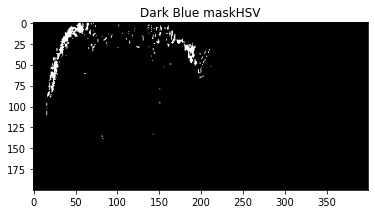

Displaying: Dark Blue resultHSV


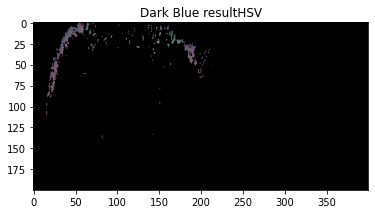

Displaying: eyeHSV


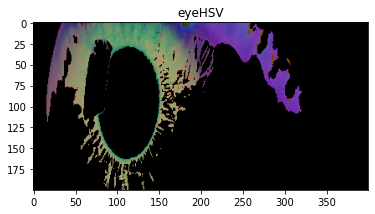

Displaying: Light Blue maskHSV


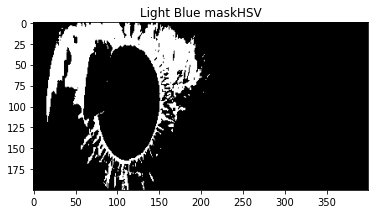

Displaying: Light Blue resultHSV


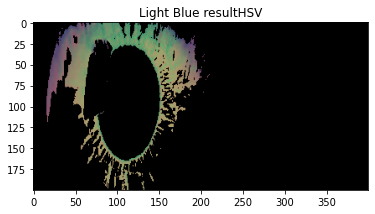

Displaying: eyeHSV


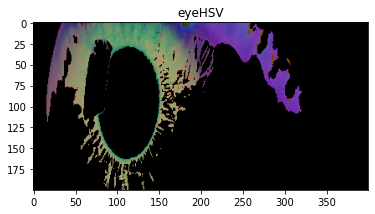

Displaying: Dark Green maskHSV


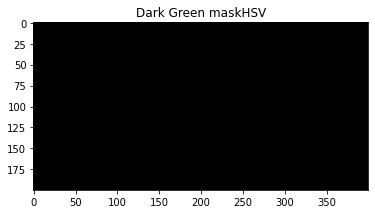

Displaying: Dark Green resultHSV


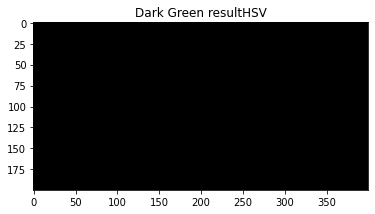

Displaying: eyeHSV


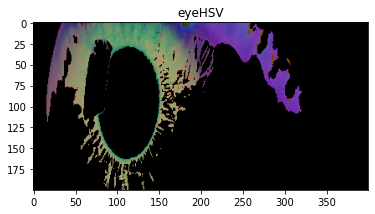

Displaying: Light Green maskHSV


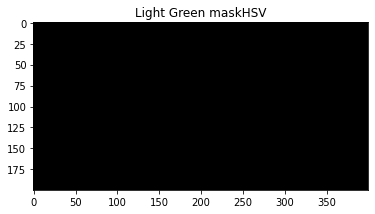

Displaying: Light Green resultHSV


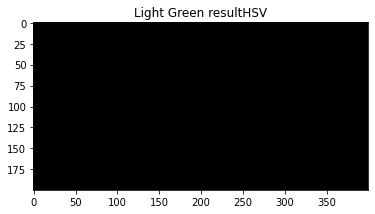

Displaying: eyeHSV


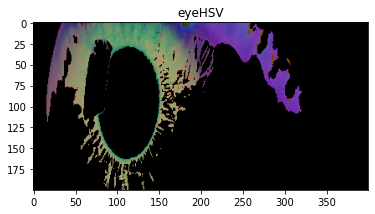

Displaying: Dark Brown maskHSV


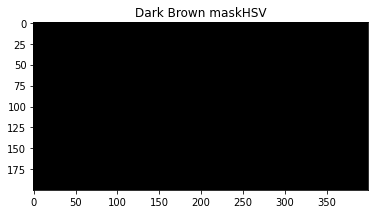

Displaying: Dark Brown resultHSV


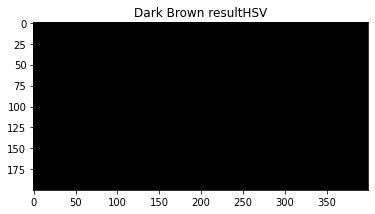

Displaying: eyeHSV


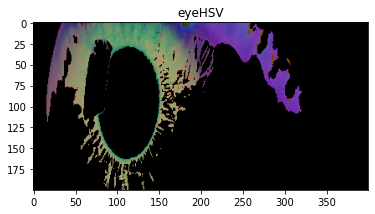

Displaying: Light Brown maskHSV


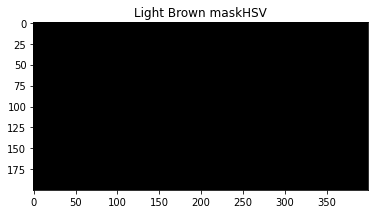

Displaying: Light Brown resultHSV


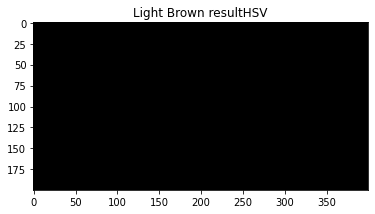

BGR Results {'Light Blue': 0.0259125, 'Dark Blue': 0.060575, 'Light Green': 0.0, 'Dark Green': 0.0011875, 'Dark Brown': 0.0, 'Light Brown': 0.0001}
HSV Results {'Dark Blue': 0.0138125, 'Light Blue': 0.1253125, 'Dark Green': 0.0, 'Light Green': 0.0, 'Dark Brown': 0.0, 'Light Brown': 0.0}
BGR found Dark Blue 6.0575 %
HSV found Light Blue 12.53125 %
------------------------------


In [9]:
def main(img):
    
    # We commented these out since we're only distributing eye photos directly,
    # but by uncommenting these lines of code and looping as necessary will
    # find eye colors from not only a eye photo, but an image contatining a human head.

    # faces = get_faces(img)
    # eyes = get_eyes_from_face(img)
    
    eye = img #eyes[0]

    eye = resize_image(eye, 700, 700)
    crop_eye = eye[250:-250, 200:-100].copy()
    eye = crop_eye # We cropped the eyes from photos as explained above. 

    show_image("Original ", crop_eye, True)

    # Apply all available masks as it results in better detection.
    result = apply_all_masks(eye)
    eye = result

    bgr_results = {
    }
    for color in bgr_colors.keys():
        b, w = detect_color_bgr(eye, color)
        bgr_results[color] = w/(w+b)

    hsv_results = {
    }
    for color in hsv_colors.keys():
        b, w = detect_color_hsv(eye, color)
        hsv_results[color] = w/(w+b)
    
    found_color_bgr = max(bgr_results, key= bgr_results.get)
    found_color_hsv = max(hsv_results, key= hsv_results.get)
    
    print("BGR Results", bgr_results)
    print("HSV Results", hsv_results)
    
    print("BGR found", found_color_bgr, (bgr_results[found_color_bgr]) * 100, "%")
    print("HSV found", found_color_hsv, (hsv_results[found_color_hsv]) * 100, "%")

if __name__ == "__main__":
    images = find_images_in_folder("aa/images")
    print(list(enumerate(images)))

    for im in images:
        print(im)
        img = cv2.imread(im)
        main(img)
        print("------------------------------")